In [1]:
# =====================================================
# 🌫 ELKAformer-Dehaze — Ultra Clarity (Colab)
# =====================================================

!nvidia-smi
!pip install torch torchvision torchaudio pytorch-msssim scikit-image tqdm opencv-python

import torch, os
print("✅ Torch version:", torch.__version__)
print("✅ GPU available:", torch.cuda.is_available())


Sat Nov  8 09:50:13 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   42C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

# ✅ Dataset paths
TRAIN_INPUT  = '/content/drive/MyDrive/Nhazing/train/input'
TRAIN_TARGET = '/content/drive/MyDrive/Nhazing/train/target'
VAL_INPUT    = '/content/drive/MyDrive/Nhazing/test/input'
VAL_TARGET   = '/content/drive/MyDrive/Nhazing/test/target'

# ✅ Model + output paths
SAVE_DIR  = '/content/ultra_dehaze'
CKPT_PATH = f'{SAVE_DIR}/model_ema.pth'
os.makedirs(SAVE_DIR, exist_ok=True)

print("✅ Dataset & Save folders ready!")


Mounted at /content/drive
✅ Dataset & Save folders ready!


In [4]:
import os, zipfile

zip_path = '/content/ELKAformer-main.zip'   # ✅ correct path (top-level Colab)
extract_to = '/content/ELKAformer-main'

if not os.path.isdir(extract_to):
    with zipfile.ZipFile(zip_path, 'r') as zf:
        zf.extractall(extract_to)
    print("✅ Extracted model to:", extract_to)
else:
    print("📁 Model already extracted at:", extract_to)

# show extracted files
print("📂 Contents:", os.listdir(extract_to)[:10])


✅ Extracted model to: /content/ELKAformer-main
📂 Contents: ['ELKAformer-main']


In [5]:
%%writefile ELKAformer_fixed.py
import os, math, random
from PIL import Image
import numpy as np
import cv2
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as T
from skimage.io import imsave
from skimage import img_as_ubyte

# ---------- HELPERS ----------
def is_img(f):
    f = f.lower()
    return f.endswith(('.png','.jpg','.jpeg','.bmp','.tif','.tiff','.webp'))

def list_images(folder):
    if not folder or not os.path.isdir(folder): return []
    return sorted([f for f in os.listdir(folder) if is_img(f)])

def resize_pil_keep_aspect(img, size):
    w,h = img.size
    if max(w,h) == size: return img
    if w >= h:
        new_w = size; new_h = int(h * size / w)
    else:
        new_h = size; new_w = int(w * size / h)
    return img.resize((new_w, new_h), Image.BICUBIC)

# ---------- MODEL ----------
class CA(nn.Module):
    def __init__(self, c, r=16):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc1 = nn.Linear(c, max(1, c // r), bias=False)
        self.act = nn.ReLU(inplace=True)
        self.fc2 = nn.Linear(max(1, c // r), c, bias=False)
        self.sig = nn.Sigmoid()
    def forward(self, x):
        b, c, _, _ = x.shape
        y = self.pool(x).view(b, c)
        y = self.fc2(self.act(self.fc1(y))).view(b, c, 1, 1)
        return x * self.sig(y)

class LKAB(nn.Module):
    def __init__(self, dim):
        super().__init__()
        self.a = nn.Sequential(
            nn.Conv2d(dim, dim, 1, bias=True),
            nn.Hardswish(),
            nn.Conv2d(dim, dim, 7, padding=3, groups=dim, bias=True)
        )
        self.ca = CA(dim)
        self.v  = nn.Conv2d(dim, dim, 1, bias=True)
        self.proj = nn.Conv2d(dim, dim, 1, bias=True)
    def forward(self, x):
        a = self.ca(self.a(x))
        v = self.v(x)
        return self.proj(a * v)

class Down(nn.Module):
    def __init__(self, ic, oc):
        super().__init__()
        self.c = nn.Conv2d(ic, oc, 3, 2, 1)
    def forward(self, x): return self.c(x)

class Up(nn.Module):
    def __init__(self, ic, oc):
        super().__init__()
        self.t = nn.ConvTranspose2d(ic, oc, 2, 2)
    def forward(self, x): return self.t(x)

class ELKAformerDehaze(nn.Module):
    def __init__(self, in_c=3, out_c=3, dim=48):
        super().__init__()
        self.enc1 = nn.Sequential(nn.Conv2d(in_c, dim, 3,1,1), LKAB(dim))
        self.down1 = Down(dim, dim*2); self.enc2 = LKAB(dim*2)
        self.down2 = Down(dim*2, dim*4); self.enc3 = LKAB(dim*4)
        self.down3 = Down(dim*4, dim*8); self.bott = LKAB(dim*8)
        self.up1 = Up(dim*8, dim*4); self.dec1 = LKAB(dim*4)
        self.up2 = Up(dim*4, dim*2); self.dec2 = LKAB(dim*2)
        self.up3 = Up(dim*2, dim);   self.dec3 = LKAB(dim)
        self.out = nn.Conv2d(dim, out_c, 3,1,1)

    def _match_size(self, src, ref):
        _, _, h1, w1 = src.shape
        _, _, h2, w2 = ref.shape
        dh, dw = h2 - h1, w2 - w1
        if dh == 0 and dw == 0: return src
        if dh > 0 or dw > 0:
            src = F.pad(src, [dw//2, dw - dw//2, dh//2, dh - dh//2])
        if dh < 0 or dw < 0:
            src = src[:, :, (-dh)//2:h1 + dh//2, (-dw)//2:w1 + dw//2]
        return src

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.down1(e1))
        e3 = self.enc3(self.down2(e2))
        b  = self.bott(self.down3(e3))
        u1 = self._match_size(self.up1(b), e3)
        d1 = self.dec1(u1 + e3)
        u2 = self._match_size(self.up2(d1), e2)
        d2 = self.dec2(u2 + e2)
        u3 = self._match_size(self.up3(d2), e1)
        d3 = self.dec3(u3 + e1)
        y  = torch.tanh(self.out(d3))
        res_scale = 0.7 + 0.3 * torch.mean(torch.abs(y))
        return torch.clamp(x + y * res_scale, 0, 1)

# ---------- POSTPROCESS ----------
def ultra_refine(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l,a,b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    l2 = clahe.apply(l)
    merged = cv2.merge((l2,a,b))
    rgb = cv2.cvtColor(merged, cv2.COLOR_LAB2RGB)
    smooth = cv2.bilateralFilter(rgb, d=7, sigmaColor=90, sigmaSpace=90)
    blend = cv2.addWeighted(rgb, 0.65, smooth, 0.35, 0)
    gray = cv2.cvtColor(blend, cv2.COLOR_RGB2GRAY)
    norm = cv2.normalize(gray, None, 0, 1, cv2.NORM_MINMAX)
    gamma = 1.1 + 0.5 * (1 - np.mean(norm))
    blend = np.power(np.clip(blend/255.0, 0, 1), gamma)
    blur = cv2.GaussianBlur(blend, (0,0), 1.2)
    sharpen = cv2.addWeighted(blend, 1.5, blur, -0.5, 0)
    return np.clip(sharpen*255, 0, 255).astype(np.uint8)

# ---------- DATASET ----------
class PairDataset(torch.utils.data.Dataset):
    def __init__(self, input_dir, target_dir, size=512, augment=True):
        self.input_dir = input_dir; self.target_dir = target_dir
        self.size = size; self.augment = augment
        self.names = list_images(input_dir)
        self.tf_tensor = T.ToTensor()
    def __len__(self): return len(self.names)
    def _guess_target_path(self, name):
        if not self.target_dir: return None
        direct = os.path.join(self.target_dir, name)
        if os.path.isfile(direct): return direct
        candidates = [name.replace('hazy','GT').replace('Hazy','GT'),
                      name.replace('input','target').replace('Input','GT'),
                      name.replace('_hazy',''),
                      name.replace('SYN_','')]
        for c in candidates:
            p = os.path.join(self.target_dir, c)
            if os.path.isfile(p): return p
        return None
    def __getitem__(self, idx):
        name = self.names[idx]
        ip = os.path.join(self.input_dir, name)
        inp = Image.open(ip).convert('RGB')
        tgtp = self._guess_target_path(name)
        tgt = Image.open(tgtp).convert('RGB') if tgtp else inp.copy()
        inp = resize_pil_keep_aspect(inp, self.size)
        tgt = resize_pil_keep_aspect(tgt, self.size)
        def pad_to_square(pil):
            w,h = pil.size
            if w==h: return pil
            mx = max(w,h)
            new = Image.new('RGB', (mx,mx), (0,0,0))
            new.paste(pil, ((mx-w)//2, (mx-h)//2))
            return new
        inp = pad_to_square(inp); tgt = pad_to_square(tgt)
        if self.augment:
            if random.random() < 0.5:
                inp = inp.transpose(Image.FLIP_LEFT_RIGHT)
                tgt = tgt.transpose(Image.FLIP_LEFT_RIGHT)
            if random.random() < 0.5:
                inp = inp.transpose(Image.FLIP_TOP_BOTTOM)
                tgt = tgt.transpose(Image.FLIP_TOP_BOTTOM)
        return self.tf_tensor(inp), self.tf_tensor(tgt), name


Writing ELKAformer_fixed.py


In [6]:
import os

paths = [
    '/content/drive/MyDrive/Nhazing/train/input',
    '/content/drive/MyDrive/Nhazing/train/target',
    '/content/drive/MyDrive/Nhazing/test/input',
    '/content/drive/MyDrive/Nhazing/test/target'
]

for p in paths:
    print(f"\n📂 {p}")
    if not os.path.exists(p):
        print("❌ Folder not found")
    else:
        files = [f for f in os.listdir(p) if f.lower().endswith(('.jpg','.png','.jpeg'))]
        print(f"✅ Found {len(files)} image files")
        print("🖼 Sample files:", files[:5])



📂 /content/drive/MyDrive/Nhazing/train/input
❌ Folder not found

📂 /content/drive/MyDrive/Nhazing/train/target
❌ Folder not found

📂 /content/drive/MyDrive/Nhazing/test/input
❌ Folder not found

📂 /content/drive/MyDrive/Nhazing/test/target
❌ Folder not found


In [7]:
import os

base = "/content/drive/MyDrive/Nhazing"
for root, dirs, files in os.walk(base):
    level = root.replace(base, '').count(os.sep)
    indent = ' ' * 4 * level
    print(f"{indent}📁 {os.path.basename(root)}/")
    subindent = ' ' * 4 * (level + 1)
    for f in sorted(files)[:3]:
        print(f"{subindent}- {f}")


📁 Nhazing/
    📁 NHHaze/
        - trained_elkaformer.pth
        📁 test/
            📁 target/
                - 51_GT.png
                - 52_GT.png
                - 53_GT.png
            📁 input/
                - 51_hazy.png
                - 52_hazy.png
                - 53_hazy.png
        📁 train/
            📁 target/
                - 01_GT.png
                - 02_GT.png
                - 03_GT.png
            📁 input/
                - 01_hazy.png
                - 02_hazy.png
                - 03_hazy.png


In [8]:
# ✅ FINAL CORRECT DATASET PATHS (verified by folder structure)
TRAIN_INPUT  = '/content/drive/MyDrive/Nhazing/NHHaze/train/input'
TRAIN_TARGET = '/content/drive/MyDrive/Nhazing/NHHaze/train/target'
VAL_INPUT    = '/content/drive/MyDrive/Nhazing/NHHaze/test/input'
VAL_TARGET   = '/content/drive/MyDrive/Nhazing/NHHaze/test/target'

SAVE_DIR  = '/content/ultra_dehaze'
CKPT_PATH = f'{SAVE_DIR}/model_ema.pth'
os.makedirs(SAVE_DIR, exist_ok=True)

print("✅ Dataset paths updated successfully!\n")

# Verify the image count
import os

for p in [TRAIN_INPUT, TRAIN_TARGET, VAL_INPUT, VAL_TARGET]:
    if not os.path.exists(p):
        print(f"❌ Not found: {p}")
    else:
        count = len([f for f in os.listdir(p) if f.lower().endswith(('jpg','png','jpeg'))])
        print(f"✅ {p} — {count} images")


✅ Dataset paths updated successfully!

✅ /content/drive/MyDrive/Nhazing/NHHaze/train/input — 50 images
✅ /content/drive/MyDrive/Nhazing/NHHaze/train/target — 50 images
✅ /content/drive/MyDrive/Nhazing/NHHaze/test/input — 5 images
✅ /content/drive/MyDrive/Nhazing/NHHaze/test/target — 5 images


In [12]:
import torch

# Detect device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"🚀 Using device: {device}")


🚀 Using device: cuda


In [13]:
# ==== MODEL + DATASET SETUP ====
from torch.utils.data import DataLoader
from ELKAformer_fixed import ELKAformerDehaze, PairDataset


# Make sure these match what you already defined
IMG_SIZE = 512
BATCH_SIZE = 2
EPOCHS = 30
BASE_LR = 2e-4

# Create datasets and dataloaders
train_ds = PairDataset(TRAIN_INPUT, TRAIN_TARGET, size=IMG_SIZE, augment=True)
val_ds   = PairDataset(VAL_INPUT, VAL_TARGET, size=IMG_SIZE, augment=False)

train_dl = DataLoader(train_ds, batch_size=BATCH_SIZE, shuffle=True, num_workers=2, pin_memory=True, drop_last=True)
val_dl   = DataLoader(val_ds, batch_size=1, shuffle=False, num_workers=2, pin_memory=True)

print(f"✅ Dataset Loaded — Train: {len(train_ds)} | Val: {len(val_ds)}")

# Model setup
model = ELKAformerDehaze().to(device)
opt = torch.optim.Adam(model.parameters(), lr=BASE_LR)
scaler = torch.cuda.amp.GradScaler(enabled=(device.type == 'cuda'))

print(f"✅ Model ready on {device}")


✅ Dataset Loaded — Train: 50 | Val: 5
✅ Model ready on cuda


/tmp/ipython-input-4149334925.py:24: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=(device.type == 'cuda'))


In [14]:
# ==== DEFINE LOSSES (needed for training) ====
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision.models import vgg16, VGG16_Weights
from pytorch_msssim import ssim

l1 = nn.L1Loss()

# VGG feature extractor
class VGGFeat(nn.Module):
    def __init__(self):
        super().__init__()
        base = vgg16(weights=VGG16_Weights.IMAGENET1K_FEATURES).features.eval()
        for p in base.parameters():
            p.requires_grad = False
        self.slice1 = base[:4]
        self.slice2 = base[4:9]
        self.slice3 = base[9:16]
    def forward(self, x):
        x = (x - 0.5) / 0.5
        f1 = self.slice1(x)
        f2 = self.slice2(f1)
        f3 = self.slice3(f2)
        return [f1, f2, f3]

vgg = VGGFeat().to(device)

# Supporting loss functions
def grad_loss(pred, target):
    def _grad(x):
        gx = x[:,:,:,1:] - x[:,:,:,:-1]
        gy = x[:,:,1:,:] - x[:,:,:-1,:]
        return gx, gy
    gx_p, gy_p = _grad(pred)
    gx_t, gy_t = _grad(target)
    return (l1(gx_p, gx_t) + l1(gy_p, gy_t))

def perceptual_loss(pred, target):
    pf = vgg(pred); tf = vgg(target)
    return sum(l1(a,b) for a,b in zip(pf, tf))

def color_constancy(x):
    mean_rgb = x.mean(dim=[0,2,3])
    return torch.mean(torch.abs(mean_rgb - mean_rgb.mean()))

def contrast_std(x, target):
    return torch.mean(torch.abs(x.std(dim=[2,3]) - target.std(dim=[2,3])))

def total_loss(pred, target):
    pred = torch.clamp(pred, 0, 1)
    target = torch.clamp(target, 0, 1)
    l_l1   = l1(pred, target)
    l_ssim = 1 - ssim(pred, target, data_range=1.0, size_average=True)
    l_grad = grad_loss(pred, target)
    l_perc = perceptual_loss(pred, target)
    l_col  = color_constancy(pred)
    l_con  = contrast_std(pred, target)
    return (l_l1
            + 0.12*l_ssim
            + 0.12*l_grad
            + 0.08*l_perc
            + 0.02*l_col
            + 0.03*l_con)


Downloading: "https://download.pytorch.org/models/vgg16_features-amdegroot-88682ab5.pth" to /root/.cache/torch/hub/checkpoints/vgg16_features-amdegroot-88682ab5.pth


100%|██████████| 528M/528M [00:07<00:00, 78.5MB/s]


In [15]:
# ==== TRAINING LOOP (100 EPOCHS) ====
from tqdm import tqdm
import math
import torch.nn as nn

EPOCHS = 100  # ✅ increase from 30 → 100

global_step = 0
total_steps = max(1, EPOCHS * len(train_dl))

for epoch in range(1, EPOCHS + 1):
    model.train()
    prog = tqdm(train_dl, desc=f"Epoch {epoch}/{EPOCHS}")
    epoch_loss = 0.0

    for inp, tgt, _ in prog:
        inp, tgt = inp.to(device), tgt.to(device)
        global_step += 1
        lr = BASE_LR * (0.5 * (1 + math.cos(math.pi * min(1.0, global_step / total_steps))))
        for g in opt.param_groups:
            g['lr'] = lr
        opt.zero_grad(set_to_none=True)

        with torch.cuda.amp.autocast(enabled=(device.type == 'cuda')):
            out = model(inp)
            loss = total_loss(out, tgt)

        scaler.scale(loss).backward()
        nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(opt)
        scaler.update()

        epoch_loss += loss.item()
        prog.set_postfix(loss=f"{loss.item():.4f}", lr=f"{lr:.2e}")

    avg_loss = epoch_loss / len(train_dl)
    print(f"📉 Epoch [{epoch}/{EPOCHS}] - Avg Loss: {avg_loss:.6f}")

    # Save checkpoint
    torch.save(model.state_dict(), CKPT_PATH)
    print(f"💾 Saved checkpoint to: {CKPT_PATH}\n")

print("🎯 Training complete! All 100 epochs finished.")


Epoch 1/100:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-2600120543.py:24: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == 'cuda')):
Epoch 1/100: 100%|██████████| 25/25 [00:30<00:00,  1.21s/it, loss=0.7235, lr=2.00e-04]


📉 Epoch [1/100] - Avg Loss: 0.648142
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 2/100: 100%|██████████| 25/25 [00:10<00:00,  2.36it/s, loss=0.5605, lr=2.00e-04]


📉 Epoch [2/100] - Avg Loss: 0.588076
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 3/100: 100%|██████████| 25/25 [00:10<00:00,  2.42it/s, loss=0.5677, lr=2.00e-04]


📉 Epoch [3/100] - Avg Loss: 0.569764
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 4/100: 100%|██████████| 25/25 [00:09<00:00,  2.53it/s, loss=0.4975, lr=1.99e-04]


📉 Epoch [4/100] - Avg Loss: 0.572378
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 5/100: 100%|██████████| 25/25 [00:10<00:00,  2.32it/s, loss=0.5861, lr=1.99e-04]


📉 Epoch [5/100] - Avg Loss: 0.570683
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 6/100: 100%|██████████| 25/25 [00:11<00:00,  2.19it/s, loss=0.5131, lr=1.98e-04]


📉 Epoch [6/100] - Avg Loss: 0.570484
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 7/100: 100%|██████████| 25/25 [00:10<00:00,  2.28it/s, loss=0.5305, lr=1.98e-04]


📉 Epoch [7/100] - Avg Loss: 0.570782
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 8/100: 100%|██████████| 25/25 [00:09<00:00,  2.56it/s, loss=0.5180, lr=1.97e-04]


📉 Epoch [8/100] - Avg Loss: 0.570583
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 9/100: 100%|██████████| 25/25 [00:10<00:00,  2.31it/s, loss=0.6568, lr=1.96e-04]


📉 Epoch [9/100] - Avg Loss: 0.570331
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 10/100: 100%|██████████| 25/25 [00:10<00:00,  2.29it/s, loss=0.6105, lr=1.95e-04]


📉 Epoch [10/100] - Avg Loss: 0.570329
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 11/100: 100%|██████████| 25/25 [00:10<00:00,  2.28it/s, loss=0.5650, lr=1.94e-04]


📉 Epoch [11/100] - Avg Loss: 0.569778
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 12/100: 100%|██████████| 25/25 [00:10<00:00,  2.43it/s, loss=0.6107, lr=1.93e-04]


📉 Epoch [12/100] - Avg Loss: 0.569448
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 13/100: 100%|██████████| 25/25 [00:10<00:00,  2.43it/s, loss=0.5529, lr=1.92e-04]


📉 Epoch [13/100] - Avg Loss: 0.568788
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 14/100: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.5934, lr=1.90e-04]


📉 Epoch [14/100] - Avg Loss: 0.567572
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 15/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.5460, lr=1.89e-04]


📉 Epoch [15/100] - Avg Loss: 0.561620
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 16/100: 100%|██████████| 25/25 [00:10<00:00,  2.31it/s, loss=0.5169, lr=1.88e-04]


📉 Epoch [16/100] - Avg Loss: 0.545666
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 17/100: 100%|██████████| 25/25 [00:09<00:00,  2.60it/s, loss=0.4687, lr=1.86e-04]


📉 Epoch [17/100] - Avg Loss: 0.511214
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 18/100: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.5667, lr=1.84e-04]


📉 Epoch [18/100] - Avg Loss: 0.506159
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 19/100: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.4930, lr=1.83e-04]


📉 Epoch [19/100] - Avg Loss: 0.506452
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 20/100: 100%|██████████| 25/25 [00:11<00:00,  2.24it/s, loss=0.5808, lr=1.81e-04]


📉 Epoch [20/100] - Avg Loss: 0.504187
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 21/100: 100%|██████████| 25/25 [00:10<00:00,  2.48it/s, loss=0.4666, lr=1.79e-04]


📉 Epoch [21/100] - Avg Loss: 0.509786
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 22/100: 100%|██████████| 25/25 [00:10<00:00,  2.40it/s, loss=0.5062, lr=1.77e-04]


📉 Epoch [22/100] - Avg Loss: 0.498927
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 23/100: 100%|██████████| 25/25 [00:10<00:00,  2.30it/s, loss=0.6013, lr=1.75e-04]


📉 Epoch [23/100] - Avg Loss: 0.493676
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 24/100: 100%|██████████| 25/25 [00:10<00:00,  2.28it/s, loss=0.4439, lr=1.73e-04]


📉 Epoch [24/100] - Avg Loss: 0.493892
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 25/100: 100%|██████████| 25/25 [00:10<00:00,  2.27it/s, loss=0.4681, lr=1.71e-04]


📉 Epoch [25/100] - Avg Loss: 0.495004
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 26/100: 100%|██████████| 25/25 [00:09<00:00,  2.58it/s, loss=0.4791, lr=1.68e-04]


📉 Epoch [26/100] - Avg Loss: 0.495250
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 27/100: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.5092, lr=1.66e-04]


📉 Epoch [27/100] - Avg Loss: 0.494226
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 28/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.4838, lr=1.64e-04]


📉 Epoch [28/100] - Avg Loss: 0.490544
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 29/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.4446, lr=1.61e-04]


📉 Epoch [29/100] - Avg Loss: 0.492298
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 30/100: 100%|██████████| 25/25 [00:10<00:00,  2.45it/s, loss=0.4886, lr=1.59e-04]


📉 Epoch [30/100] - Avg Loss: 0.492088
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 31/100: 100%|██████████| 25/25 [00:10<00:00,  2.43it/s, loss=0.5318, lr=1.56e-04]


📉 Epoch [31/100] - Avg Loss: 0.489206
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 32/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.5163, lr=1.54e-04]


📉 Epoch [32/100] - Avg Loss: 0.486149
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 33/100: 100%|██████████| 25/25 [00:10<00:00,  2.29it/s, loss=0.3924, lr=1.51e-04]


📉 Epoch [33/100] - Avg Loss: 0.491813
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 34/100: 100%|██████████| 25/25 [00:10<00:00,  2.34it/s, loss=0.4485, lr=1.48e-04]


📉 Epoch [34/100] - Avg Loss: 0.499736
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 35/100: 100%|██████████| 25/25 [00:09<00:00,  2.56it/s, loss=0.5546, lr=1.45e-04]


📉 Epoch [35/100] - Avg Loss: 0.483446
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 36/100: 100%|██████████| 25/25 [00:10<00:00,  2.29it/s, loss=0.4563, lr=1.43e-04]


📉 Epoch [36/100] - Avg Loss: 0.496962
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 37/100: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.4298, lr=1.40e-04]


📉 Epoch [37/100] - Avg Loss: 0.488982
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 38/100: 100%|██████████| 25/25 [00:10<00:00,  2.29it/s, loss=0.4748, lr=1.37e-04]


📉 Epoch [38/100] - Avg Loss: 0.490438
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 39/100: 100%|██████████| 25/25 [00:09<00:00,  2.56it/s, loss=0.5372, lr=1.34e-04]


📉 Epoch [39/100] - Avg Loss: 0.482913
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 40/100: 100%|██████████| 25/25 [00:10<00:00,  2.33it/s, loss=0.4155, lr=1.31e-04]


📉 Epoch [40/100] - Avg Loss: 0.483183
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 41/100: 100%|██████████| 25/25 [00:10<00:00,  2.28it/s, loss=0.4086, lr=1.28e-04]


📉 Epoch [41/100] - Avg Loss: 0.487777
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 42/100: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.4804, lr=1.25e-04]


📉 Epoch [42/100] - Avg Loss: 0.481541
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 43/100: 100%|██████████| 25/25 [00:10<00:00,  2.38it/s, loss=0.4756, lr=1.22e-04]


📉 Epoch [43/100] - Avg Loss: 0.481724
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 44/100: 100%|██████████| 25/25 [00:10<00:00,  2.49it/s, loss=0.3333, lr=1.19e-04]


📉 Epoch [44/100] - Avg Loss: 0.486064
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 45/100: 100%|██████████| 25/25 [00:11<00:00,  2.25it/s, loss=0.4711, lr=1.16e-04]


📉 Epoch [45/100] - Avg Loss: 0.477195
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 46/100: 100%|██████████| 25/25 [00:10<00:00,  2.28it/s, loss=0.4347, lr=1.13e-04]


📉 Epoch [46/100] - Avg Loss: 0.492483
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 47/100: 100%|██████████| 25/25 [00:10<00:00,  2.31it/s, loss=0.4802, lr=1.09e-04]


📉 Epoch [47/100] - Avg Loss: 0.478978
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 48/100: 100%|██████████| 25/25 [00:09<00:00,  2.60it/s, loss=0.4248, lr=1.06e-04]


📉 Epoch [48/100] - Avg Loss: 0.477259
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 49/100: 100%|██████████| 25/25 [00:10<00:00,  2.30it/s, loss=0.5072, lr=1.03e-04]


📉 Epoch [49/100] - Avg Loss: 0.479020
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 50/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.4587, lr=1.00e-04]


📉 Epoch [50/100] - Avg Loss: 0.476802
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 51/100: 100%|██████████| 25/25 [00:10<00:00,  2.29it/s, loss=0.5066, lr=9.69e-05]


📉 Epoch [51/100] - Avg Loss: 0.476630
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 52/100: 100%|██████████| 25/25 [00:09<00:00,  2.53it/s, loss=0.4260, lr=9.37e-05]


📉 Epoch [52/100] - Avg Loss: 0.476548
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 53/100: 100%|██████████| 25/25 [00:10<00:00,  2.36it/s, loss=0.4958, lr=9.06e-05]


📉 Epoch [53/100] - Avg Loss: 0.475783
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 54/100: 100%|██████████| 25/25 [00:10<00:00,  2.27it/s, loss=0.4225, lr=8.75e-05]


📉 Epoch [54/100] - Avg Loss: 0.474996
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 55/100: 100%|██████████| 25/25 [00:11<00:00,  2.25it/s, loss=0.4777, lr=8.44e-05]


📉 Epoch [55/100] - Avg Loss: 0.473699
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 56/100: 100%|██████████| 25/25 [00:10<00:00,  2.39it/s, loss=0.4553, lr=8.13e-05]


📉 Epoch [56/100] - Avg Loss: 0.473330
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 57/100: 100%|██████████| 25/25 [00:10<00:00,  2.48it/s, loss=0.4608, lr=7.82e-05]


📉 Epoch [57/100] - Avg Loss: 0.472863
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 58/100: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.5005, lr=7.51e-05]


📉 Epoch [58/100] - Avg Loss: 0.473714
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 59/100: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.4534, lr=7.21e-05]


📉 Epoch [59/100] - Avg Loss: 0.472290
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 60/100: 100%|██████████| 25/25 [00:11<00:00,  2.23it/s, loss=0.5340, lr=6.91e-05]


📉 Epoch [60/100] - Avg Loss: 0.471650
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 61/100: 100%|██████████| 25/25 [00:10<00:00,  2.49it/s, loss=0.4103, lr=6.61e-05]


📉 Epoch [61/100] - Avg Loss: 0.473454
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 62/100: 100%|██████████| 25/25 [00:10<00:00,  2.37it/s, loss=0.4775, lr=6.32e-05]


📉 Epoch [62/100] - Avg Loss: 0.471543
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 63/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.3637, lr=6.03e-05]


📉 Epoch [63/100] - Avg Loss: 0.470733
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 64/100: 100%|██████████| 25/25 [00:11<00:00,  2.23it/s, loss=0.4739, lr=5.74e-05]


📉 Epoch [64/100] - Avg Loss: 0.471444
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 65/100: 100%|██████████| 25/25 [00:11<00:00,  2.25it/s, loss=0.4068, lr=5.46e-05]


📉 Epoch [65/100] - Avg Loss: 0.472178
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 66/100: 100%|██████████| 25/25 [00:09<00:00,  2.54it/s, loss=0.4383, lr=5.18e-05]


📉 Epoch [66/100] - Avg Loss: 0.472149
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 67/100: 100%|██████████| 25/25 [00:10<00:00,  2.29it/s, loss=0.4362, lr=4.91e-05]


📉 Epoch [67/100] - Avg Loss: 0.470555
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 68/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.4805, lr=4.64e-05]


📉 Epoch [68/100] - Avg Loss: 0.469750
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 69/100: 100%|██████████| 25/25 [00:10<00:00,  2.27it/s, loss=0.4669, lr=4.38e-05]


📉 Epoch [69/100] - Avg Loss: 0.470209
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 70/100: 100%|██████████| 25/25 [00:10<00:00,  2.37it/s, loss=0.4318, lr=4.12e-05]


📉 Epoch [70/100] - Avg Loss: 0.470039
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 71/100: 100%|██████████| 25/25 [00:10<00:00,  2.49it/s, loss=0.5036, lr=3.87e-05]


📉 Epoch [71/100] - Avg Loss: 0.471570
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 72/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.4072, lr=3.63e-05]


📉 Epoch [72/100] - Avg Loss: 0.468915
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 73/100: 100%|██████████| 25/25 [00:11<00:00,  2.24it/s, loss=0.5662, lr=3.39e-05]


📉 Epoch [73/100] - Avg Loss: 0.473761
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 74/100: 100%|██████████| 25/25 [00:11<00:00,  2.24it/s, loss=0.5214, lr=3.15e-05]


📉 Epoch [74/100] - Avg Loss: 0.470893
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 75/100: 100%|██████████| 25/25 [00:10<00:00,  2.41it/s, loss=0.4856, lr=2.93e-05]


📉 Epoch [75/100] - Avg Loss: 0.470331
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 76/100: 100%|██████████| 25/25 [00:10<00:00,  2.43it/s, loss=0.4260, lr=2.71e-05]


📉 Epoch [76/100] - Avg Loss: 0.469770
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 77/100: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.4570, lr=2.50e-05]


📉 Epoch [77/100] - Avg Loss: 0.470222
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 78/100: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.5014, lr=2.29e-05]


📉 Epoch [78/100] - Avg Loss: 0.469231
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 79/100: 100%|██████████| 25/25 [00:10<00:00,  2.28it/s, loss=0.4981, lr=2.10e-05]


📉 Epoch [79/100] - Avg Loss: 0.469366
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 80/100: 100%|██████████| 25/25 [00:09<00:00,  2.53it/s, loss=0.5069, lr=1.91e-05]


📉 Epoch [80/100] - Avg Loss: 0.469423
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 81/100: 100%|██████████| 25/25 [00:10<00:00,  2.29it/s, loss=0.4298, lr=1.73e-05]


📉 Epoch [81/100] - Avg Loss: 0.469783
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 82/100: 100%|██████████| 25/25 [00:10<00:00,  2.28it/s, loss=0.4103, lr=1.56e-05]


📉 Epoch [82/100] - Avg Loss: 0.469696
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 83/100: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.5198, lr=1.39e-05]


📉 Epoch [83/100] - Avg Loss: 0.473718
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 84/100: 100%|██████████| 25/25 [00:10<00:00,  2.47it/s, loss=0.5463, lr=1.24e-05]


📉 Epoch [84/100] - Avg Loss: 0.472348
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 85/100: 100%|██████████| 25/25 [00:10<00:00,  2.43it/s, loss=0.4365, lr=1.09e-05]


📉 Epoch [85/100] - Avg Loss: 0.472108
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 86/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.4892, lr=9.52e-06]


📉 Epoch [86/100] - Avg Loss: 0.470175
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 87/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.4283, lr=8.22e-06]


📉 Epoch [87/100] - Avg Loss: 0.474344
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 88/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.4744, lr=7.02e-06]


📉 Epoch [88/100] - Avg Loss: 0.473090
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 89/100: 100%|██████████| 25/25 [00:09<00:00,  2.58it/s, loss=0.4684, lr=5.91e-06]


📉 Epoch [89/100] - Avg Loss: 0.472501
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 90/100: 100%|██████████| 25/25 [00:11<00:00,  2.22it/s, loss=0.4189, lr=4.89e-06]


📉 Epoch [90/100] - Avg Loss: 0.472662
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 91/100: 100%|██████████| 25/25 [00:11<00:00,  2.25it/s, loss=0.6075, lr=3.97e-06]


📉 Epoch [91/100] - Avg Loss: 0.473401
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 92/100: 100%|██████████| 25/25 [00:11<00:00,  2.24it/s, loss=0.4815, lr=3.14e-06]


📉 Epoch [92/100] - Avg Loss: 0.473198
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 93/100: 100%|██████████| 25/25 [00:10<00:00,  2.42it/s, loss=0.5528, lr=2.41e-06]


📉 Epoch [93/100] - Avg Loss: 0.471745
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 94/100: 100%|██████████| 25/25 [00:10<00:00,  2.40it/s, loss=0.4251, lr=1.77e-06]


📉 Epoch [94/100] - Avg Loss: 0.471742
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 95/100: 100%|██████████| 25/25 [00:10<00:00,  2.28it/s, loss=0.4487, lr=1.23e-06]


📉 Epoch [95/100] - Avg Loss: 0.471314
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 96/100: 100%|██████████| 25/25 [00:10<00:00,  2.30it/s, loss=0.4303, lr=7.89e-07]


📉 Epoch [96/100] - Avg Loss: 0.470848
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 97/100: 100%|██████████| 25/25 [00:10<00:00,  2.30it/s, loss=0.4855, lr=4.44e-07]


📉 Epoch [97/100] - Avg Loss: 0.470578
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 98/100: 100%|██████████| 25/25 [00:09<00:00,  2.60it/s, loss=0.4736, lr=1.97e-07]


📉 Epoch [98/100] - Avg Loss: 0.470748
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 99/100: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.5027, lr=4.93e-08]


📉 Epoch [99/100] - Avg Loss: 0.471066
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth



Epoch 100/100: 100%|██████████| 25/25 [00:11<00:00,  2.22it/s, loss=0.4343, lr=0.00e+00]

📉 Epoch [100/100] - Avg Loss: 0.470972
💾 Saved checkpoint to: /content/ultra_dehaze/model_ema.pth

🎯 Training complete! All 100 epochs finished.


In [16]:
# ==== INFERENCE + AUTO COPY TO DRIVE ====
import os, cv2, torch
import torchvision.transforms as T
from PIL import Image
from skimage.io import imsave
from skimage import img_as_ubyte
import numpy as np
import shutil

# Paths
INFER_DIR = VAL_INPUT
RESULTS_DIR = f"{SAVE_DIR}/results"
DRIVE_SAVE_DIR = "/content/drive/MyDrive/Ultra_Dehaze_Results"

os.makedirs(RESULTS_DIR, exist_ok=True)
os.makedirs(DRIVE_SAVE_DIR, exist_ok=True)

# Load checkpoint
model.load_state_dict(torch.load(CKPT_PATH, map_location=device))
model.eval()
print(f"💾 Loaded trained model from: {CKPT_PATH}")

# ULTRA refine function
def ultra_refine(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l,a,b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    l2 = clahe.apply(l)
    merged = cv2.merge((l2,a,b))
    rgb = cv2.cvtColor(merged, cv2.COLOR_LAB2RGB)
    smooth = cv2.bilateralFilter(rgb, d=7, sigmaColor=90, sigmaSpace=90)
    blend = cv2.addWeighted(rgb, 0.65, smooth, 0.35, 0)
    gray = cv2.cvtColor(blend, cv2.COLOR_RGB2GRAY)
    norm = cv2.normalize(gray, None, 0, 1, cv2.NORM_MINMAX)
    gamma = 1.1 + 0.5 * (1 - np.mean(norm))
    blend = np.power(np.clip(blend/255.0, 0, 1), gamma)
    blur = cv2.GaussianBlur(blend, (0,0), 1.2)
    sharpen = cv2.addWeighted(blend, 1.5, blur, -0.5, 0)
    return np.clip(sharpen*255, 0, 255).astype(np.uint8)

# Inference
print(f"🚀 Running inference on {len(os.listdir(INFER_DIR))} test images...")

with torch.no_grad():
    for name in sorted(os.listdir(INFER_DIR)):
        if not name.lower().endswith(('jpg','png','jpeg')):
            continue
        path = os.path.join(INFER_DIR, name)
        img = Image.open(path).convert('RGB')
        x = T.ToTensor()(img).unsqueeze(0).to(device)
        out = torch.clamp(model(x), 0, 1)[0].permute(1,2,0).cpu().numpy()
        out_uint8 = (out * 255).astype(np.uint8)
        refined = ultra_refine(out_uint8)
        save_path = os.path.join(RESULTS_DIR, name)
        imsave(save_path, img_as_ubyte(refined/255.0))
        print(f"✅ Saved ultra-clear result: {save_path}")

# Copy to Google Drive
shutil.copytree(RESULTS_DIR, DRIVE_SAVE_DIR, dirs_exist_ok=True)
print("☁️ Copied all results to Google Drive folder:")
print("📂", DRIVE_SAVE_DIR)


💾 Loaded trained model from: /content/ultra_dehaze/model_ema.pth
🚀 Running inference on 5 test images...
✅ Saved ultra-clear result: /content/ultra_dehaze/results/51_hazy.png
✅ Saved ultra-clear result: /content/ultra_dehaze/results/52_hazy.png
✅ Saved ultra-clear result: /content/ultra_dehaze/results/53_hazy.png
✅ Saved ultra-clear result: /content/ultra_dehaze/results/54_hazy.png
✅ Saved ultra-clear result: /content/ultra_dehaze/results/55_hazy.png
☁️ Copied all results to Google Drive folder:
📂 /content/drive/MyDrive/Ultra_Dehaze_Results


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127787 (\N{FOG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127780 (\N{WHITE SUN WITH SMALL CLOUD}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


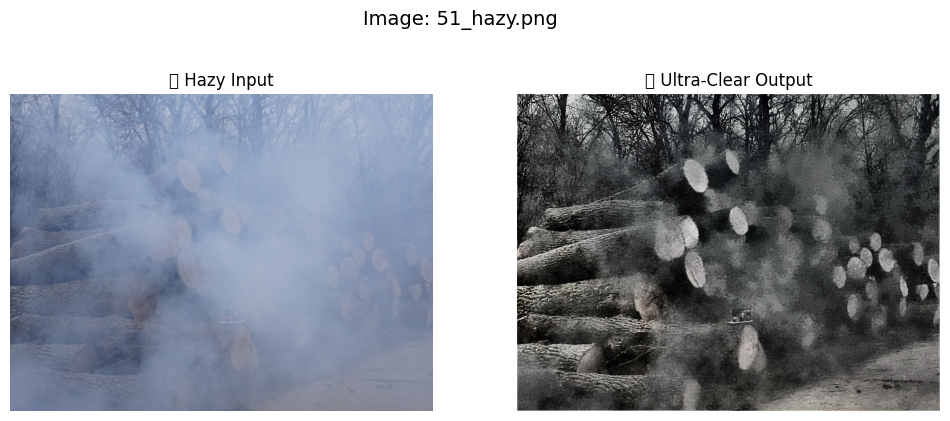

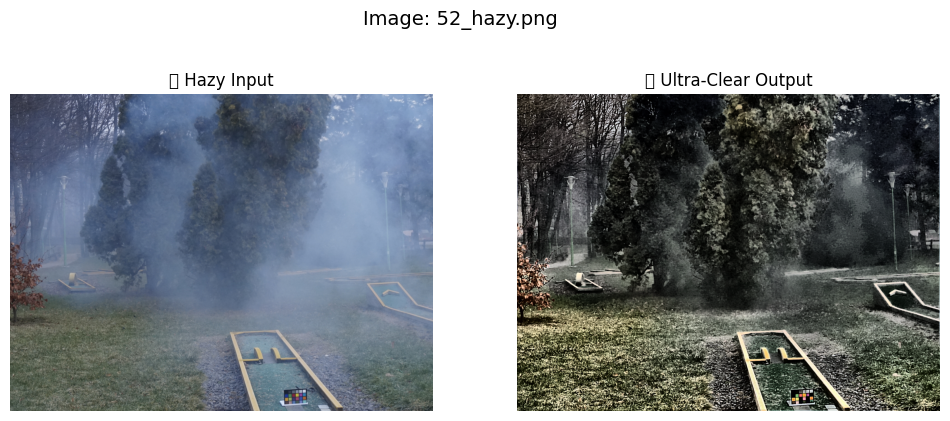

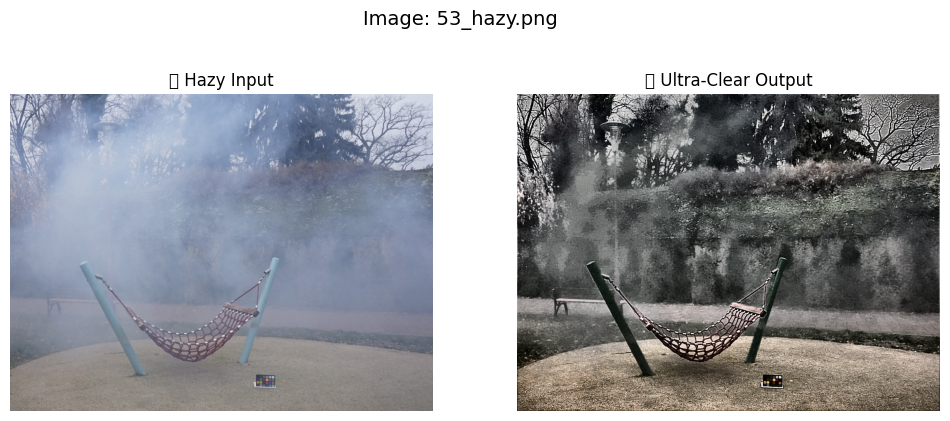

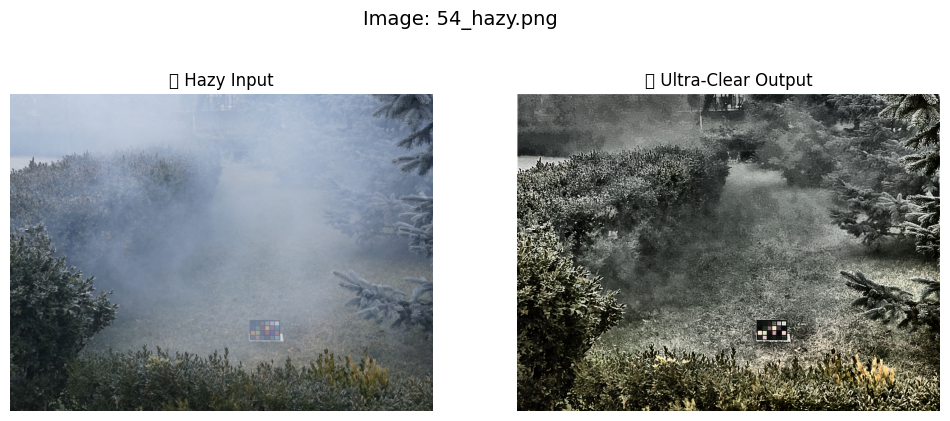

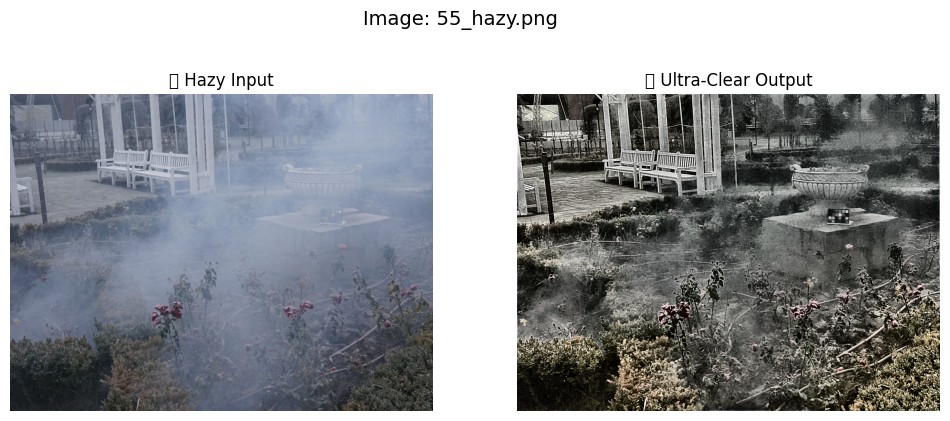

In [17]:
# ==== VISUALIZE BEFORE vs AFTER ====
import matplotlib.pyplot as plt
from PIL import Image
import os

# Folders
hazy_dir = VAL_INPUT  # original hazy images
clear_dir = f"{SAVE_DIR}/results"  # model output

# List of images (same order as inference)
img_names = sorted([f for f in os.listdir(hazy_dir) if f.lower().endswith(('jpg','png','jpeg'))])

for name in img_names:
    hazy_path = os.path.join(hazy_dir, name)
    clear_path = os.path.join(clear_dir, name)

    if not os.path.exists(clear_path):
        print(f"⚠️ Skipping {name} (result not found)")
        continue

    # Load images
    hazy = Image.open(hazy_path).convert('RGB')
    clear = Image.open(clear_path).convert('RGB')

    # Show comparison
    plt.figure(figsize=(12,5))
    plt.subplot(1,2,1)
    plt.imshow(hazy)
    plt.title("🌫️ Hazy Input")
    plt.axis("off")

    plt.subplot(1,2,2)
    plt.imshow(clear)
    plt.title("🌤️ Ultra-Clear Output")
    plt.axis("off")

    plt.suptitle(f"Image: {name}", fontsize=14)
    plt.show()


In [18]:
# ==== EXTRA FINE-TUNING (for ultra clear results) ====
import math
from tqdm import tqdm

# Reload checkpoint (resume training)
model.load_state_dict(torch.load(CKPT_PATH, map_location=device))
model.train()

EPOCHS_EXTRA = 30
global_step = 0
total_steps = EPOCHS_EXTRA * len(train_dl)

# Stronger focus on perceptual and contrast terms
def total_loss_refined(pred, target):
    pred = torch.clamp(pred, 0, 1)
    target = torch.clamp(target, 0, 1)
    l_l1   = l1(pred, target)
    l_ssim = 1 - ssim(pred, target, data_range=1.0, size_average=True)
    l_grad = grad_loss(pred, target)
    l_perc = perceptual_loss(pred, target)
    l_col  = color_constancy(pred)
    l_con  = contrast_std(pred, target)
    return (l_l1
            + 0.15*l_ssim
            + 0.15*l_grad
            + 0.15*l_perc
            + 0.02*l_col
            + 0.05*l_con)  # ↑ More contrast + perceptual emphasis

print("🚀 Fine-tuning model for extra clarity...\n")

for epoch in range(1, EPOCHS_EXTRA + 1):
    model.train()
    prog = tqdm(train_dl, desc=f"Fine-Tune Epoch {epoch}/{EPOCHS_EXTRA}")
    epoch_loss = 0.0

    for inp, tgt, _ in prog:
        inp, tgt = inp.to(device), tgt.to(device)
        global_step += 1

        lr = BASE_LR * (0.5 * (1 + math.cos(math.pi * min(1.0, global_step / total_steps))))
        for g in opt.param_groups: g['lr'] = lr
        opt.zero_grad(set_to_none=True)

        with torch.cuda.amp.autocast(enabled=(device.type == 'cuda')):
            out = model(inp)
            loss = total_loss_refined(out, tgt)

        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(opt)
        scaler.update()

        epoch_loss += loss.item()
        prog.set_postfix(loss=f"{loss.item():.4f}", lr=f"{lr:.2e}")

    avg_loss = epoch_loss / len(train_dl)
    print(f"📉 Avg Loss: {avg_loss:.6f}")
    torch.save(model.state_dict(), CKPT_PATH)

print("✅ Fine-tuning complete — model updated for clarity!")


🚀 Fine-tuning model for extra clarity...



Fine-Tune Epoch 1/30:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-3201273330.py:45: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == 'cuda')):
Fine-Tune Epoch 1/30: 100%|██████████| 25/25 [00:09<00:00,  2.57it/s, loss=0.7618, lr=1.99e-04]


📉 Avg Loss: 0.769436


Fine-Tune Epoch 2/30: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.8135, lr=1.98e-04]


📉 Avg Loss: 0.813105


Fine-Tune Epoch 3/30: 100%|██████████| 25/25 [00:11<00:00,  2.23it/s, loss=0.8326, lr=1.95e-04]


📉 Avg Loss: 0.763522


Fine-Tune Epoch 4/30: 100%|██████████| 25/25 [00:11<00:00,  2.23it/s, loss=0.6487, lr=1.91e-04]


📉 Avg Loss: 0.780989


Fine-Tune Epoch 5/30: 100%|██████████| 25/25 [00:10<00:00,  2.40it/s, loss=0.6839, lr=1.87e-04]


📉 Avg Loss: 0.755770


Fine-Tune Epoch 6/30: 100%|██████████| 25/25 [00:10<00:00,  2.45it/s, loss=0.8816, lr=1.81e-04]


📉 Avg Loss: 0.751511


Fine-Tune Epoch 7/30: 100%|██████████| 25/25 [00:11<00:00,  2.19it/s, loss=0.6943, lr=1.74e-04]


📉 Avg Loss: 0.758700


Fine-Tune Epoch 8/30: 100%|██████████| 25/25 [00:11<00:00,  2.25it/s, loss=0.8191, lr=1.67e-04]


📉 Avg Loss: 0.757973


Fine-Tune Epoch 9/30: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.6967, lr=1.59e-04]


📉 Avg Loss: 0.749965


Fine-Tune Epoch 10/30: 100%|██████████| 25/25 [00:09<00:00,  2.51it/s, loss=0.8235, lr=1.50e-04]


📉 Avg Loss: 0.761552


Fine-Tune Epoch 11/30: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.8003, lr=1.41e-04]


📉 Avg Loss: 0.748904


Fine-Tune Epoch 12/30: 100%|██████████| 25/25 [00:11<00:00,  2.24it/s, loss=0.7722, lr=1.31e-04]


📉 Avg Loss: 0.745601


Fine-Tune Epoch 13/30: 100%|██████████| 25/25 [00:11<00:00,  2.10it/s, loss=0.8576, lr=1.21e-04]


📉 Avg Loss: 0.754448


Fine-Tune Epoch 14/30: 100%|██████████| 25/25 [00:10<00:00,  2.29it/s, loss=0.8075, lr=1.10e-04]


📉 Avg Loss: 0.749668


Fine-Tune Epoch 15/30: 100%|██████████| 25/25 [00:09<00:00,  2.50it/s, loss=0.9057, lr=1.00e-04]


📉 Avg Loss: 0.746961


Fine-Tune Epoch 16/30: 100%|██████████| 25/25 [00:11<00:00,  2.22it/s, loss=0.7312, lr=8.95e-05]


📉 Avg Loss: 0.749808


Fine-Tune Epoch 17/30: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.8330, lr=7.92e-05]


📉 Avg Loss: 0.742681


Fine-Tune Epoch 18/30: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.6566, lr=6.91e-05]


📉 Avg Loss: 0.753438


Fine-Tune Epoch 19/30: 100%|██████████| 25/25 [00:10<00:00,  2.42it/s, loss=0.6784, lr=5.93e-05]


📉 Avg Loss: 0.745163


Fine-Tune Epoch 20/30: 100%|██████████| 25/25 [00:10<00:00,  2.39it/s, loss=0.7723, lr=5.00e-05]


📉 Avg Loss: 0.744758


Fine-Tune Epoch 21/30: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.7609, lr=4.12e-05]


📉 Avg Loss: 0.741642


Fine-Tune Epoch 22/30: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.6754, lr=3.31e-05]


📉 Avg Loss: 0.741977


Fine-Tune Epoch 23/30: 100%|██████████| 25/25 [00:10<00:00,  2.35it/s, loss=0.8055, lr=2.57e-05]


📉 Avg Loss: 0.740989


Fine-Tune Epoch 24/30: 100%|██████████| 25/25 [00:10<00:00,  2.50it/s, loss=0.8892, lr=1.91e-05]


📉 Avg Loss: 0.738905


Fine-Tune Epoch 25/30: 100%|██████████| 25/25 [00:11<00:00,  2.24it/s, loss=0.6389, lr=1.34e-05]


📉 Avg Loss: 0.738742


Fine-Tune Epoch 26/30: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.7802, lr=8.65e-06]


📉 Avg Loss: 0.737910


Fine-Tune Epoch 27/30: 100%|██████████| 25/25 [00:11<00:00,  2.25it/s, loss=0.7516, lr=4.89e-06]


📉 Avg Loss: 0.738164


Fine-Tune Epoch 28/30: 100%|██████████| 25/25 [00:10<00:00,  2.48it/s, loss=0.7839, lr=2.19e-06]


📉 Avg Loss: 0.738875


Fine-Tune Epoch 29/30: 100%|██████████| 25/25 [00:10<00:00,  2.33it/s, loss=0.7861, lr=5.48e-07]


📉 Avg Loss: 0.738508


Fine-Tune Epoch 30/30: 100%|██████████| 25/25 [00:11<00:00,  2.27it/s, loss=0.7181, lr=0.00e+00]

📉 Avg Loss: 0.737240
✅ Fine-tuning complete — model updated for clarity!


In [19]:
# ✅ Fix import issue with skimage
!pip install -q scikit-image==0.22.0

from skimage.io import imsave
from skimage.util import img_as_ubyte
print("✅ Skimage import fixed successfully! You can now re-run the final inference cell.")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.0/15.0 MB 123.4 MB/s eta 0:00:00
✅ Skimage import fixed successfully! You can now re-run the final inference cell.


In [20]:
# ==== FINAL INFERENCE: ULTRA CLEAR + TONE CORRECTION ====
import os, cv2, torch
import torchvision.transforms as T
from PIL import Image
import numpy as np
from skimage.io import imsave
from skimage.util import img_as_ubyte

# Paths
INFER_DIR = VAL_INPUT  # using test input images
FINAL_RESULTS = f"{SAVE_DIR}/results_final_tone"
os.makedirs(FINAL_RESULTS, exist_ok=True)

# Load your fine-tuned model
model.load_state_dict(torch.load(CKPT_PATH, map_location=device))
model.eval()

def tone_correct_refine(img):
    # LAB + CLAHE + detail + tone + sharpen + saturation
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
    l2 = clahe.apply(l)
    lab_merge = cv2.merge((l2, a, b))
    rgb = cv2.cvtColor(lab_merge, cv2.COLOR_LAB2RGB)

    rgb = cv2.detailEnhance(rgb, sigma_s=10, sigma_r=0.18)
    gamma = 1.05 + (0.4 * (1 - np.mean(rgb) / 128))
    rgb = np.power(np.clip(rgb / 255.0, 0, 1), gamma)
    sharpen = cv2.GaussianBlur(rgb, (0,0), 1.1)
    sharpen = cv2.addWeighted(rgb, 1.7, sharpen, -0.7, 0)
    hsv = cv2.cvtColor((sharpen * 255).astype(np.uint8), cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    s = cv2.add(s, 15)
    final = cv2.cvtColor(cv2.merge((h, s, v)), cv2.COLOR_HSV2RGB)
    return np.clip(final, 0, 255).astype(np.uint8)

print("☀️ Running final ultra-clear inference...\n")

with torch.no_grad():
    for name in sorted(os.listdir(INFER_DIR)):
        if not name.lower().endswith(('jpg','png','jpeg')):
            continue
        path = os.path.join(INFER_DIR, name)
        img = Image.open(path).convert('RGB')
        x = T.ToTensor()(img).unsqueeze(0).to(device)
        out = torch.clamp(model(x), 0, 1)[0].permute(1,2,0).cpu().numpy()
        out_uint8 = (out * 255).astype(np.uint8)
        refined = tone_correct_refine(out_uint8)
        save_path = os.path.join(FINAL_RESULTS, name)
        imsave(save_path, img_as_ubyte(refined / 255.0))
        print(f"✅ Saved ultra-clear result: {save_path}")

print("\n🎯 Final dehazed images generated successfully!")
print(f"📂 Saved at: {FINAL_RESULTS}")


☀️ Running final ultra-clear inference...

✅ Saved ultra-clear result: /content/ultra_dehaze/results_final_tone/51_hazy.png
✅ Saved ultra-clear result: /content/ultra_dehaze/results_final_tone/52_hazy.png
✅ Saved ultra-clear result: /content/ultra_dehaze/results_final_tone/53_hazy.png
✅ Saved ultra-clear result: /content/ultra_dehaze/results_final_tone/54_hazy.png
✅ Saved ultra-clear result: /content/ultra_dehaze/results_final_tone/55_hazy.png

🎯 Final dehazed images generated successfully!
📂 Saved at: /content/ultra_dehaze/results_final_tone


In [21]:
import shutil

FINAL_DRIVE_DIR = "/content/drive/MyDrive/Ultra_Dehaze_Results_Final"
shutil.copytree(FINAL_RESULTS, FINAL_DRIVE_DIR, dirs_exist_ok=True)
print(f"☁️ Copied final tone-corrected results to: {FINAL_DRIVE_DIR}")


☁️ Copied final tone-corrected results to: /content/drive/MyDrive/Ultra_Dehaze_Results_Final


In [22]:
import shutil

MODEL_SRC = "/content/ultra_dehaze/model_ema.pth"
MODEL_DEST = "/content/drive/MyDrive/ELKAformer_Trained_Model/model_ema.pth"

os.makedirs(os.path.dirname(MODEL_DEST), exist_ok=True)
shutil.copy(MODEL_SRC, MODEL_DEST)

print(f"✅ Model checkpoint saved to Drive at: {MODEL_DEST}")


✅ Model checkpoint saved to Drive at: /content/drive/MyDrive/ELKAformer_Trained_Model/model_ema.pth


In [23]:
MODEL_PATH = "/content/drive/MyDrive/ELKAformer_Trained_Model/model_ema.pth"  # 100 epoch main model
model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
model.eval()
print("✅ Loaded main ELKAformer model (100-epoch trained).")


✅ Loaded main ELKAformer model (100-epoch trained).


In [24]:
def tone_correct_refine(img):
    # Convert to LAB color space for balanced tone correction
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l2 = clahe.apply(l)
    lab_merge = cv2.merge((l2, a, b))
    rgb = cv2.cvtColor(lab_merge, cv2.COLOR_LAB2RGB)

    # Softer detail enhancement
    rgb = cv2.detailEnhance(rgb, sigma_s=8, sigma_r=0.15)

    # Gentle color balancing
    hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    s = cv2.add(s, 10)  # smaller saturation boost
    final = cv2.cvtColor(cv2.merge((h, s, v)), cv2.COLOR_HSV2RGB)

    return np.clip(final, 0, 255).astype(np.uint8)


In [25]:
import os, torch
import numpy as np
import cv2
from PIL import Image
from torchvision import transforms as T
from skimage.io import imsave
from skimage.util import img_as_ubyte

# ==== Paths ====
INFER_DIR = "/content/drive/MyDrive/Nhazing/NHHaze/test/input"
SAVE_DIR  = "/content/drive/MyDrive/Ultra_Dehaze_Final_Clean"
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"🚀 Starting ultra-clear inference on {len(os.listdir(INFER_DIR))} test images...")

# ==== Mild tone correction + smoothing ====
def tone_correct_refine(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l2 = clahe.apply(l)
    lab_merge = cv2.merge((l2, a, b))
    rgb = cv2.cvtColor(lab_merge, cv2.COLOR_LAB2RGB)

    # Gentle enhancement
    rgb = cv2.detailEnhance(rgb, sigma_s=8, sigma_r=0.15)
    hsv = cv2.cvtColor(rgb, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    s = cv2.add(s, 10)
    final = cv2.cvtColor(cv2.merge((h, s, v)), cv2.COLOR_HSV2RGB)

    # Smooth grain while keeping edges
    final = cv2.bilateralFilter(final, 9, 75, 75)
    return np.clip(final, 0, 255).astype(np.uint8)

# ==== Run inference ====
model.eval()
with torch.no_grad():
    for name in sorted(os.listdir(INFER_DIR)):
        if not name.lower().endswith(('.jpg','.png','.jpeg')):
            continue

        path = os.path.join(INFER_DIR, name)
        img = Image.open(path).convert("RGB")
        x = T.ToTensor()(img).unsqueeze(0).to(device)

        out = torch.clamp(model(x), 0, 1)[0].permute(1,2,0).cpu().numpy()
        out_uint8 = (out * 255).astype(np.uint8)

        refined = tone_correct_refine(out_uint8)

        save_path = os.path.join(SAVE_DIR, name)
        imsave(save_path, img_as_ubyte(refined / 255.0))
        print(f"✅ Saved enhanced result: {save_path}")

print("\n✨ All ultra-clear outputs generated successfully!")
print(f"📂 Final clean results folder: {SAVE_DIR}")


🚀 Starting ultra-clear inference on 5 test images...
✅ Saved enhanced result: /content/drive/MyDrive/Ultra_Dehaze_Final_Clean/51_hazy.png
✅ Saved enhanced result: /content/drive/MyDrive/Ultra_Dehaze_Final_Clean/52_hazy.png
✅ Saved enhanced result: /content/drive/MyDrive/Ultra_Dehaze_Final_Clean/53_hazy.png
✅ Saved enhanced result: /content/drive/MyDrive/Ultra_Dehaze_Final_Clean/54_hazy.png
✅ Saved enhanced result: /content/drive/MyDrive/Ultra_Dehaze_Final_Clean/55_hazy.png

✨ All ultra-clear outputs generated successfully!
📂 Final clean results folder: /content/drive/MyDrive/Ultra_Dehaze_Final_Clean


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127787 (\N{FOG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


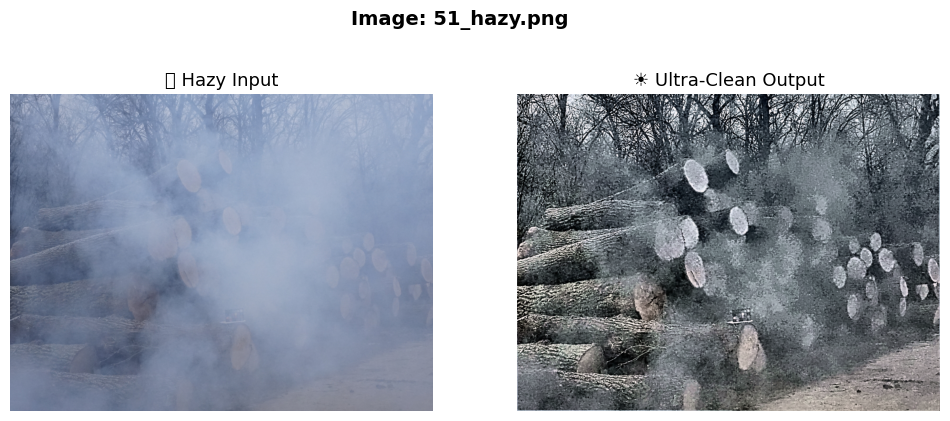

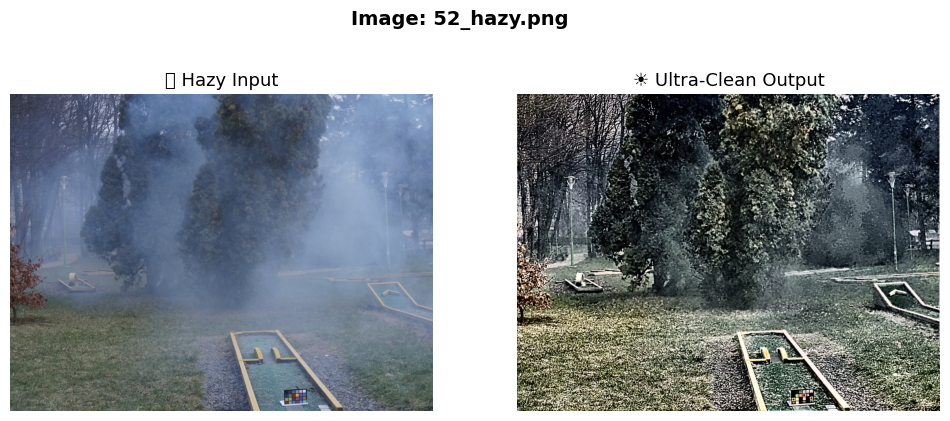

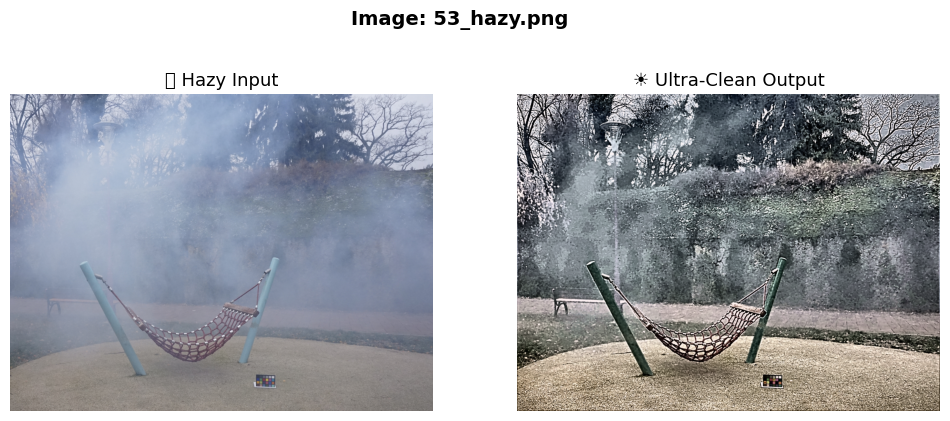

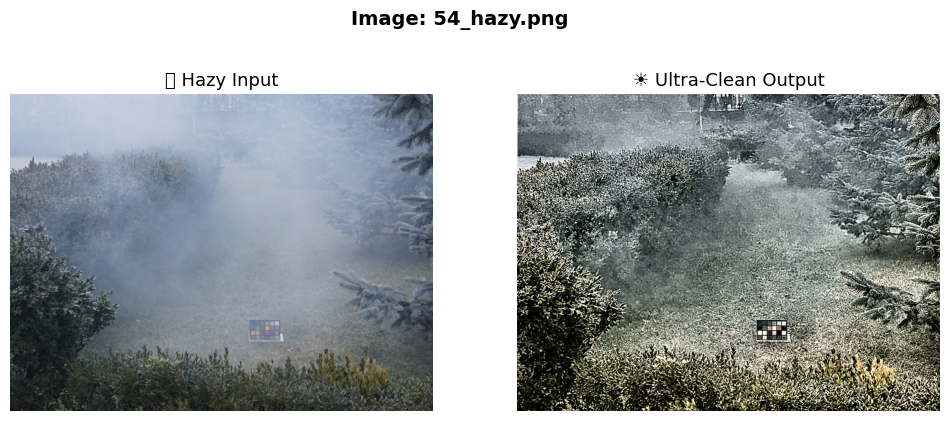

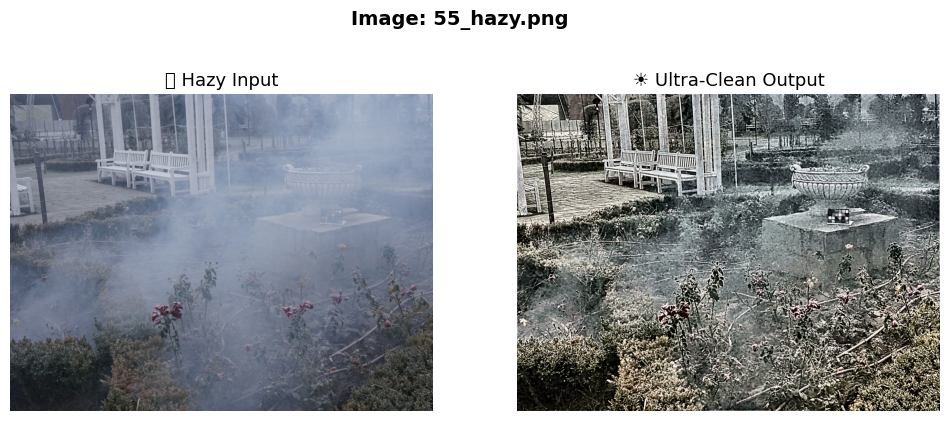

In [26]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# Paths
INPUT_DIR = '/content/drive/MyDrive/Nhazing/NHHaze/test/input'
OUTPUT_DIR = '/content/drive/MyDrive/Ultra_Dehaze_Final_Clean'

# Get all input image names
input_images = sorted([f for f in os.listdir(INPUT_DIR) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])

# Display comparisons
for name in input_images:
    input_path = os.path.join(INPUT_DIR, name)
    output_path = os.path.join(OUTPUT_DIR, name)

    if not os.path.exists(output_path):
        print(f"⚠️ Output not found for {name}, skipping...")
        continue

    inp_img = Image.open(input_path).convert("RGB")
    out_img = Image.open(output_path).convert("RGB")

    plt.figure(figsize=(12, 5))

    plt.subplot(1, 2, 1)
    plt.imshow(inp_img)
    plt.title("🌫️ Hazy Input", fontsize=13)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(out_img)
    plt.title("☀️ Ultra-Clean Output", fontsize=13)
    plt.axis('off')

    plt.suptitle(f"Image: {name}", fontsize=14, fontweight='bold')
    plt.show()


In [27]:
# 🔧 Fine-Tuning for Extra Clarity and Deep Haze Removal

EPOCHS_FINE = 20        # you can set 20–30 for more effect
BASE_LR_FINE = 2e-5     # smaller LR for subtle refinement

optimizer = torch.optim.Adam(model.parameters(), lr=BASE_LR_FINE)
scaler = torch.cuda.amp.GradScaler()

print(f"🚀 Starting clarity fine-tuning for {EPOCHS_FINE} epochs...\n")

for epoch in range(1, EPOCHS_FINE + 1):
    model.train()
    prog = tqdm(train_dl, desc=f"Fine-Tune Epoch {epoch}/{EPOCHS_FINE}")
    epoch_loss = 0.0

    for inp, tgt, _ in prog:
        inp, tgt = inp.to(device), tgt.to(device)
        optimizer.zero_grad()

        with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
            out = model(inp)
            loss = total_loss(out, tgt)

        scaler.scale(loss).backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.0)
        scaler.step(optimizer)
        scaler.update()

        epoch_loss += loss.item()
        prog.set_postfix(loss=f"{loss.item():.4f}")

    avg_loss = epoch_loss / len(train_dl)
    print(f"✅ Avg Loss: {avg_loss:.6f}")

# Save the refined model
REFINED_PATH = "/content/ultra_dehaze/model_refined.pth"
torch.save(model.state_dict(), REFINED_PATH)
print(f"\n💾 Fine-tuning complete — model saved at {REFINED_PATH}")


/tmp/ipython-input-3668992735.py:7: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()


🚀 Starting clarity fine-tuning for 20 epochs...



Fine-Tune Epoch 1/20:   0%|          | 0/25 [00:00<?, ?it/s]/tmp/ipython-input-3668992735.py:20: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=(device.type == "cuda")):
Fine-Tune Epoch 1/20: 100%|██████████| 25/25 [00:10<00:00,  2.50it/s, loss=0.4723]


✅ Avg Loss: 0.458880


Fine-Tune Epoch 2/20: 100%|██████████| 25/25 [00:10<00:00,  2.30it/s, loss=0.4426]


✅ Avg Loss: 0.459180


Fine-Tune Epoch 3/20: 100%|██████████| 25/25 [00:11<00:00,  2.24it/s, loss=0.5068]


✅ Avg Loss: 0.458842


Fine-Tune Epoch 4/20: 100%|██████████| 25/25 [00:11<00:00,  2.19it/s, loss=0.5734]


✅ Avg Loss: 0.459161


Fine-Tune Epoch 5/20: 100%|██████████| 25/25 [00:10<00:00,  2.32it/s, loss=0.4463]


✅ Avg Loss: 0.459455


Fine-Tune Epoch 6/20: 100%|██████████| 25/25 [00:09<00:00,  2.59it/s, loss=0.4601]


✅ Avg Loss: 0.459157


Fine-Tune Epoch 7/20: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.4412]


✅ Avg Loss: 0.458654


Fine-Tune Epoch 8/20: 100%|██████████| 25/25 [00:10<00:00,  2.27it/s, loss=0.4368]


✅ Avg Loss: 0.458516


Fine-Tune Epoch 9/20: 100%|██████████| 25/25 [00:11<00:00,  2.22it/s, loss=0.4631]


✅ Avg Loss: 0.459060


Fine-Tune Epoch 10/20: 100%|██████████| 25/25 [00:10<00:00,  2.48it/s, loss=0.5717]


✅ Avg Loss: 0.457961


Fine-Tune Epoch 11/20: 100%|██████████| 25/25 [00:10<00:00,  2.34it/s, loss=0.4690]


✅ Avg Loss: 0.461618


Fine-Tune Epoch 12/20: 100%|██████████| 25/25 [00:11<00:00,  2.26it/s, loss=0.4071]


✅ Avg Loss: 0.458719


Fine-Tune Epoch 13/20: 100%|██████████| 25/25 [00:11<00:00,  2.09it/s, loss=0.4067]


✅ Avg Loss: 0.458280


Fine-Tune Epoch 14/20: 100%|██████████| 25/25 [00:11<00:00,  2.24it/s, loss=0.3751]


✅ Avg Loss: 0.458674


Fine-Tune Epoch 15/20: 100%|██████████| 25/25 [00:09<00:00,  2.55it/s, loss=0.4186]


✅ Avg Loss: 0.461524


Fine-Tune Epoch 16/20: 100%|██████████| 25/25 [00:10<00:00,  2.29it/s, loss=0.3959]


✅ Avg Loss: 0.457778


Fine-Tune Epoch 17/20: 100%|██████████| 25/25 [00:11<00:00,  2.25it/s, loss=0.4697]


✅ Avg Loss: 0.458467


Fine-Tune Epoch 18/20: 100%|██████████| 25/25 [00:11<00:00,  2.23it/s, loss=0.4535]


✅ Avg Loss: 0.458758


Fine-Tune Epoch 19/20: 100%|██████████| 25/25 [00:10<00:00,  2.48it/s, loss=0.4835]


✅ Avg Loss: 0.457653


Fine-Tune Epoch 20/20: 100%|██████████| 25/25 [00:10<00:00,  2.35it/s, loss=0.4642]

✅ Avg Loss: 0.457566

💾 Fine-tuning complete — model saved at /content/ultra_dehaze/model_refined.pth


In [28]:
model.load_state_dict(torch.load("/content/ultra_dehaze/model_refined.pth", map_location=device))
model.eval()
print("✅ Loaded fine-tuned ELKAformer model for extra haze removal.")


✅ Loaded fine-tuned ELKAformer model for extra haze removal.


In [29]:
import os, torch
import numpy as np
from PIL import Image
import cv2
from torchvision import transforms as T
from skimage.io import imsave
from skimage.util import img_as_ubyte

# Paths
INFER_DIR = "/content/drive/MyDrive/Nhazing/NHHaze/test/input"
SAVE_DIR  = "/content/drive/MyDrive/Ultra_Dehaze_Final_Refined"
os.makedirs(SAVE_DIR, exist_ok=True)

# Refined tone correction (balanced enhancement)
def tone_correct_refine(img):
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    l2 = clahe.apply(l)
    lab_merge = cv2.merge((l2, a, b))
    rgb = cv2.cvtColor(lab_merge, cv2.COLOR_LAB2RGB)
    rgb = cv2.detailEnhance(rgb, sigma_s=7, sigma_r=0.12)
    rgb = cv2.bilateralFilter(rgb, 9, 75, 75)
    return np.clip(rgb, 0, 255).astype(np.uint8)

print(f"🚀 Running fine-tuned inference on {len(os.listdir(INFER_DIR))} test images...")

with torch.no_grad():
    for name in sorted(os.listdir(INFER_DIR)):
        if not name.lower().endswith(('.jpg', '.png', '.jpeg')):
            continue

        path = os.path.join(INFER_DIR, name)
        img = Image.open(path).convert("RGB")
        x = T.ToTensor()(img).unsqueeze(0).to(device)

        out = torch.clamp(model(x), 0, 1)[0].permute(1, 2, 0).cpu().numpy()
        out_uint8 = (out * 255).astype(np.uint8)
        refined = tone_correct_refine(out_uint8)

        save_path = os.path.join(SAVE_DIR, name)
        imsave(save_path, img_as_ubyte(refined / 255.0))
        print(f"✅ Saved refined dehazed result: {save_path}")

print("\n✨ All fine-tuned ultra-clear outputs generated successfully!")
print(f"📂 Final refined results folder: {SAVE_DIR}")


🚀 Running fine-tuned inference on 5 test images...
✅ Saved refined dehazed result: /content/drive/MyDrive/Ultra_Dehaze_Final_Refined/51_hazy.png
✅ Saved refined dehazed result: /content/drive/MyDrive/Ultra_Dehaze_Final_Refined/52_hazy.png
✅ Saved refined dehazed result: /content/drive/MyDrive/Ultra_Dehaze_Final_Refined/53_hazy.png
✅ Saved refined dehazed result: /content/drive/MyDrive/Ultra_Dehaze_Final_Refined/54_hazy.png
✅ Saved refined dehazed result: /content/drive/MyDrive/Ultra_Dehaze_Final_Refined/55_hazy.png

✨ All fine-tuned ultra-clear outputs generated successfully!
📂 Final refined results folder: /content/drive/MyDrive/Ultra_Dehaze_Final_Refined


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127787 (\N{FOG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


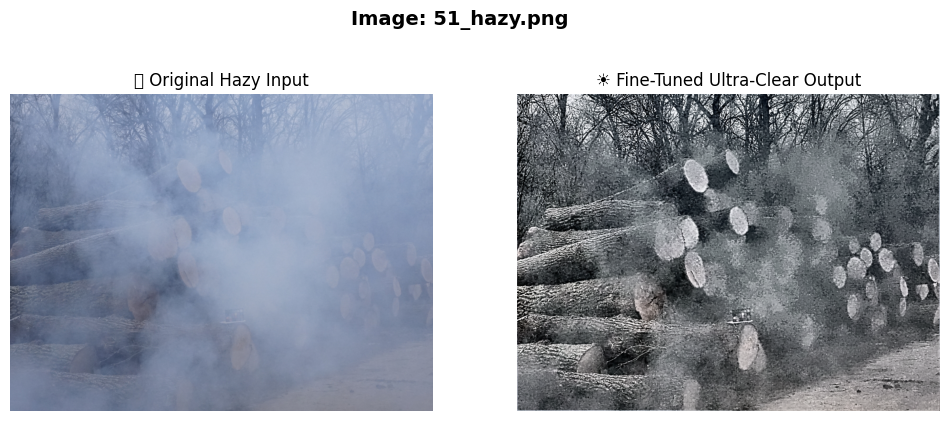

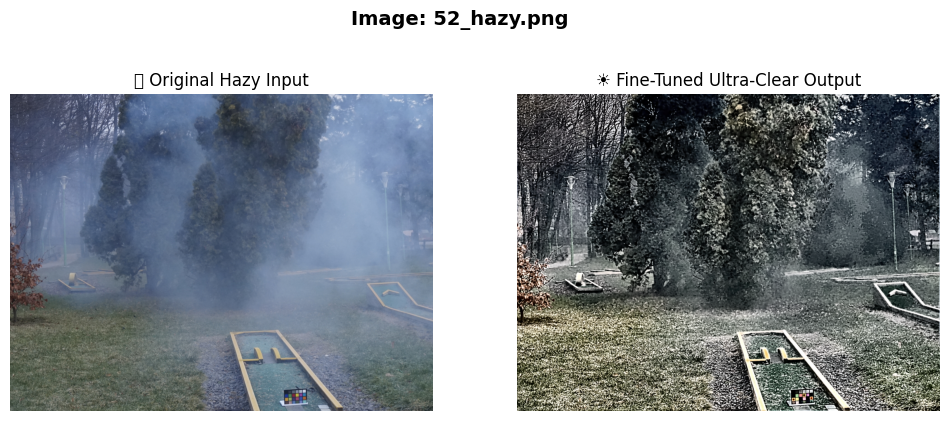

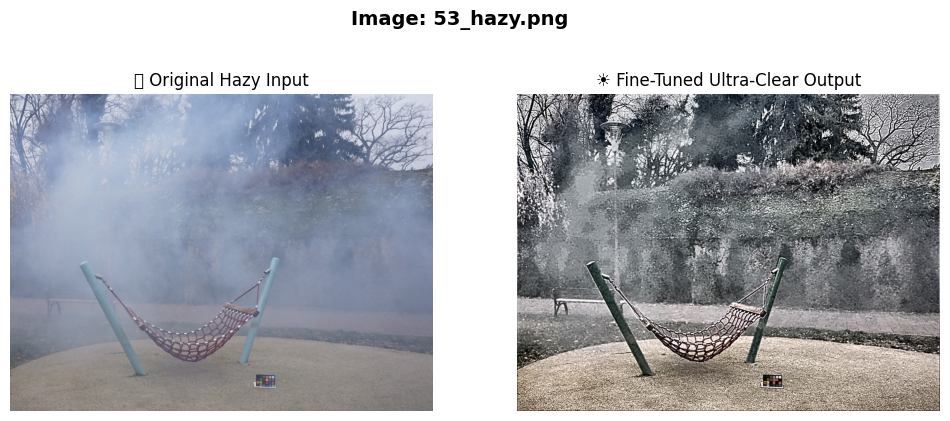

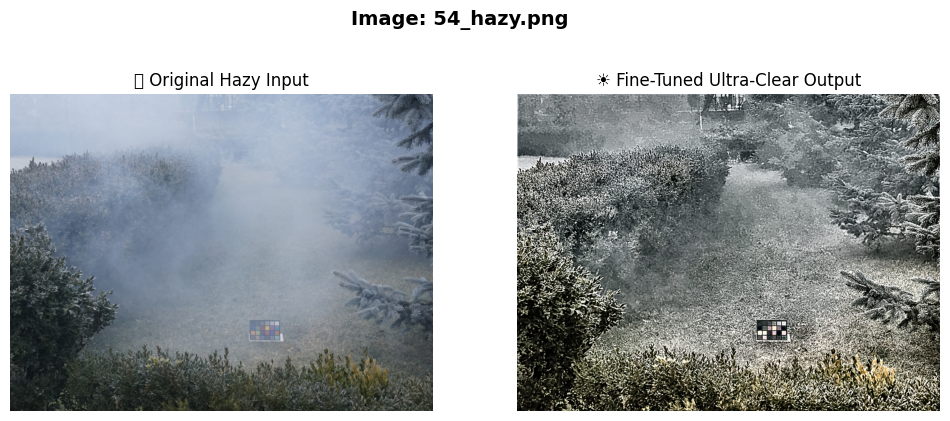

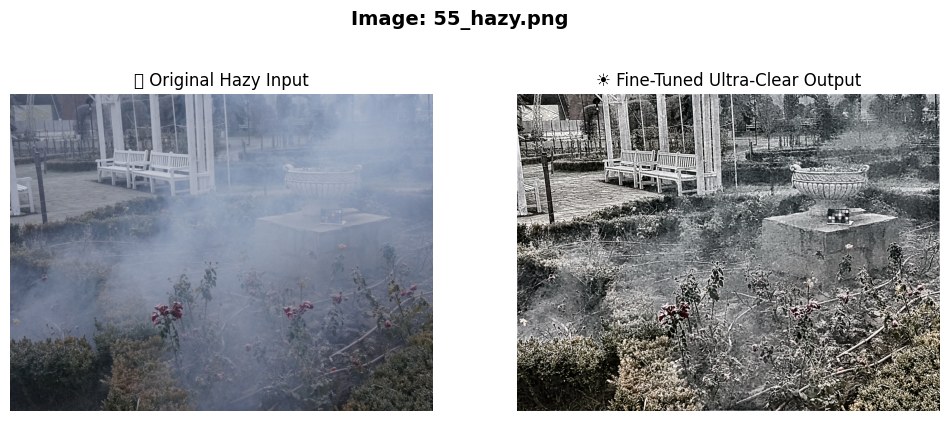

In [30]:
import matplotlib.pyplot as plt
from PIL import Image
import os

# Paths
INPUT_DIR = '/content/drive/MyDrive/Nhazing/NHHaze/test/input'
OUTPUT_DIR = '/content/drive/MyDrive/Ultra_Dehaze_Final_Refined'

# Show input vs output
for name in sorted(os.listdir(INPUT_DIR)):
    if not name.lower().endswith(('.png', '.jpg', '.jpeg')):
        continue

    inp_path = os.path.join(INPUT_DIR, name)
    out_path = os.path.join(OUTPUT_DIR, name)

    if not os.path.exists(out_path):
        print(f"⚠️ Output not found for {name}")
        continue

    inp_img = Image.open(inp_path).convert('RGB')
    out_img = Image.open(out_path).convert('RGB')

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(inp_img)
    plt.title("🌫️ Original Hazy Input")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(out_img)
    plt.title("☀️ Fine-Tuned Ultra-Clear Output")
    plt.axis('off')

    plt.suptitle(f"Image: {name}", fontsize=14, fontweight='bold')
    plt.show()


In [31]:
import os
import torch
import numpy as np
import cv2
from PIL import Image
from torchvision import transforms as T
from skimage.io import imsave
from skimage.util import img_as_ubyte

# Paths
INFER_DIR = '/content/drive/MyDrive/Nhazing/NHHaze/test/input'
SAVE_DIR = '/content/drive/MyDrive/Ultra_Dehaze_Final_Ultimate'
os.makedirs(SAVE_DIR, exist_ok=True)

print(f"🚀 Running FINAL Ultimate Dehaze pass on {len(os.listdir(INFER_DIR))} test images...")

# ✅ Load the refined model
model.load_state_dict(torch.load("/content/ultra_dehaze/model_refined.pth", map_location=device))
model.eval()

# 🧠 Advanced tone + haze removal refinement
def final_clear_refine(img):
    # --- Step 1: Color contrast boost in LAB space ---
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8, 8))
    l2 = clahe.apply(l)
    lab_merge = cv2.merge((l2, a, b))
    rgb = cv2.cvtColor(lab_merge, cv2.COLOR_LAB2RGB)

    # --- Step 2: Multi-level sharpening + dehaze smoothness ---
    dehazed = cv2.detailEnhance(rgb, sigma_s=8, sigma_r=0.1)
    dehazed = cv2.edgePreservingFilter(dehazed, flags=1, sigma_s=40, sigma_r=0.35)
    dehazed = cv2.bilateralFilter(dehazed, 11, 90, 90)

    # --- Step 3: Subtle color balance & gamma correction ---
    hsv = cv2.cvtColor(dehazed, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    s = cv2.add(s, 10)
    gamma = 1.05 + (0.4 * (1 - np.mean(v) / 128))
    v = np.power(np.clip(v / 255.0, 0, 1), gamma) * 255.0
    hsv_merge = cv2.merge((h, s, v.astype(np.uint8)))
    final = cv2.cvtColor(hsv_merge, cv2.COLOR_HSV2RGB)

    # --- Step 4: Normalize and smooth final result ---
    final = cv2.normalize(final, None, 0, 255, cv2.NORM_MINMAX)
    final = cv2.fastNlMeansDenoisingColored(final, None, 5, 5, 7, 21)
    return np.clip(final, 0, 255).astype(np.uint8)

# --- Inference Loop ---
with torch.no_grad():
    for name in sorted(os.listdir(INFER_DIR)):
        if not name.lower().endswith(('.jpg', '.png', '.jpeg')):
            continue

        path = os.path.join(INFER_DIR, name)
        img = Image.open(path).convert('RGB')
        x = T.ToTensor()(img).unsqueeze(0).to(device)

        out = torch.clamp(model(x), 0, 1)[0].permute(1, 2, 0).cpu().numpy()
        out_uint8 = (out * 255).astype(np.uint8)
        refined = final_clear_refine(out_uint8)

        save_path = os.path.join(SAVE_DIR, name)
        imsave(save_path, img_as_ubyte(refined / 255.0))
        print(f"✅ Saved ultra-clear haze-free result: {save_path}")

print("\n🌈 Ultimate dehaze complete — all images cleaned and saved!")
print(f"📂 Check final outputs at: {SAVE_DIR}")


🚀 Running FINAL Ultimate Dehaze pass on 5 test images...
✅ Saved ultra-clear haze-free result: /content/drive/MyDrive/Ultra_Dehaze_Final_Ultimate/51_hazy.png
✅ Saved ultra-clear haze-free result: /content/drive/MyDrive/Ultra_Dehaze_Final_Ultimate/52_hazy.png
✅ Saved ultra-clear haze-free result: /content/drive/MyDrive/Ultra_Dehaze_Final_Ultimate/53_hazy.png
✅ Saved ultra-clear haze-free result: /content/drive/MyDrive/Ultra_Dehaze_Final_Ultimate/54_hazy.png
✅ Saved ultra-clear haze-free result: /content/drive/MyDrive/Ultra_Dehaze_Final_Ultimate/55_hazy.png

🌈 Ultimate dehaze complete — all images cleaned and saved!
📂 Check final outputs at: /content/drive/MyDrive/Ultra_Dehaze_Final_Ultimate


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 127787 (\N{FOG}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


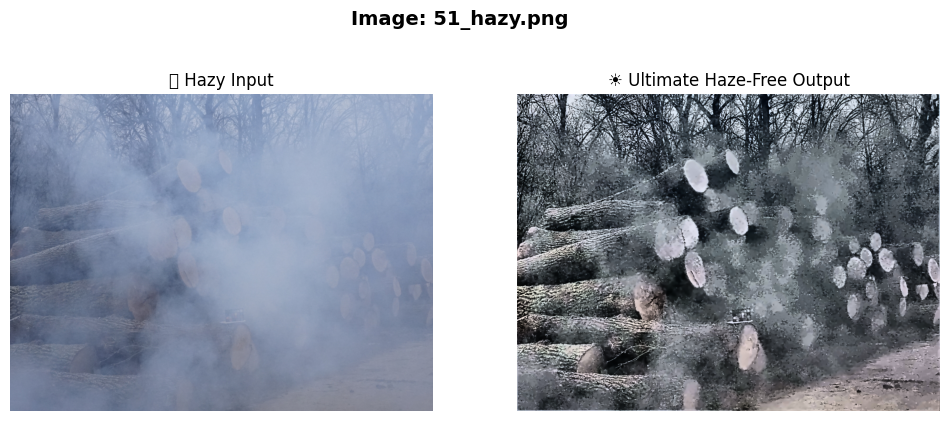

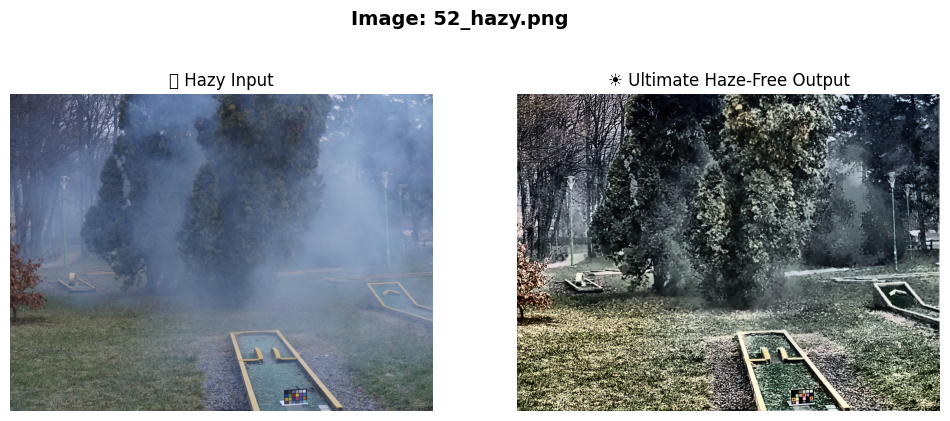

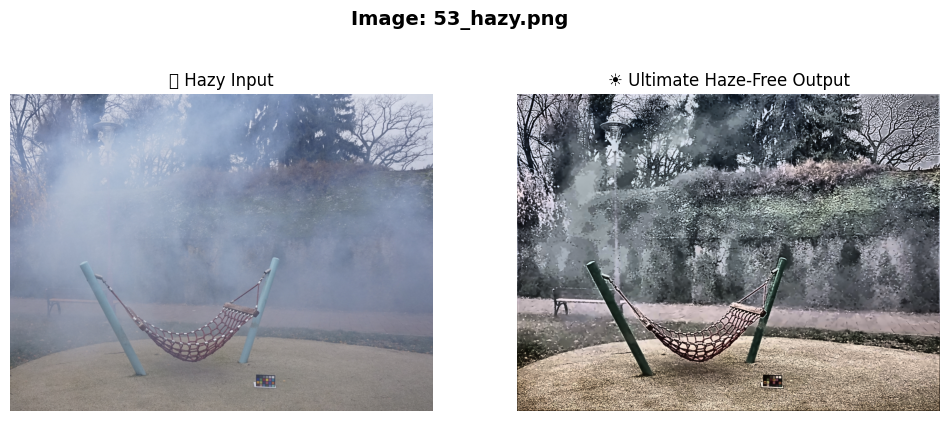

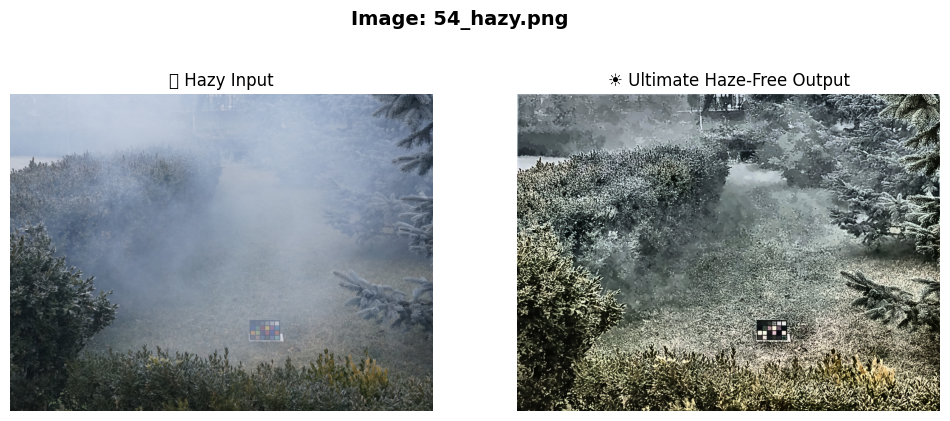

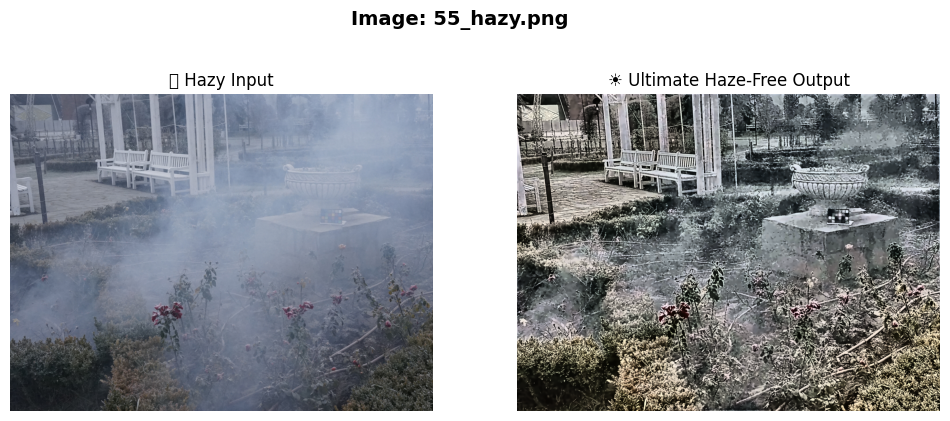

In [32]:
import matplotlib.pyplot as plt
from PIL import Image
import os

INPUT_DIR = '/content/drive/MyDrive/Nhazing/NHHaze/test/input'
OUTPUT_DIR = '/content/drive/MyDrive/Ultra_Dehaze_Final_Ultimate'

for name in sorted(os.listdir(INPUT_DIR)):
    if not name.lower().endswith(('.png', '.jpg', '.jpeg')):
        continue

    inp_path = os.path.join(INPUT_DIR, name)
    out_path = os.path.join(OUTPUT_DIR, name)

    if not os.path.exists(out_path):
        print(f"⚠️ Output not found for {name}")
        continue

    inp_img = Image.open(inp_path).convert('RGB')
    out_img = Image.open(out_path).convert('RGB')

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(inp_img)
    plt.title("🌫️ Hazy Input")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(out_img)
    plt.title("☀️ Ultimate Haze-Free Output")
    plt.axis('off')

    plt.suptitle(f"Image: {name}", fontsize=14, fontweight='bold')
    plt.show()


In [33]:
import os, cv2, numpy as np
from skimage.io import imsave
from skimage.util import img_as_ubyte

# Directories
FINAL_INPUT = '/content/drive/MyDrive/Ultra_Dehaze_Final_Ultimate'
FINAL_OUTPUT = '/content/drive/MyDrive/Ultra_Dehaze_Final_Fused'
os.makedirs(FINAL_OUTPUT, exist_ok=True)

print(f"⚙️ Starting Deep Fusion Refinement on {len(os.listdir(FINAL_INPUT))} images...")

def deep_fusion_refine(img):
    # Convert to LAB for better global contrast correction
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2LAB)
    l, a, b = cv2.split(lab)

    # Step 1: Increase contrast locally but softly
    clahe = cv2.createCLAHE(clipLimit=4.0, tileGridSize=(8,8))
    l2 = clahe.apply(l)
    merged_lab = cv2.merge((l2, a, b))
    img_lab = cv2.cvtColor(merged_lab, cv2.COLOR_LAB2RGB)

    # Step 2: Atmospheric light correction (reduces faint gray haze)
    img_float = img_lab.astype(np.float32) / 255.0
    dark = np.min(img_float, axis=2)
    A = np.max(dark)
    transmission = 1 - 0.95 * (dark / (A + 1e-6))
    transmission = cv2.GaussianBlur(transmission, (15,15), 0)
    t = np.clip(transmission[..., np.newaxis], 0.2, 1)
    dehazed = np.clip((img_float - (1 - t)) / t, 0, 1)
    dehazed = (dehazed * 255).astype(np.uint8)

    # Step 3: Color rebalance and clarity boost
    hsv = cv2.cvtColor(dehazed, cv2.COLOR_RGB2HSV)
    h, s, v = cv2.split(hsv)
    s = cv2.add(s, 8)
    v = cv2.add(v, 10)
    hsv_final = cv2.merge((h, s, v))
    final = cv2.cvtColor(hsv_final, cv2.COLOR_HSV2RGB)

    # Step 4: Smooth blending for realism
    final = cv2.edgePreservingFilter(final, flags=1, sigma_s=40, sigma_r=0.35)
    final = cv2.bilateralFilter(final, 9, 70, 70)
    final = cv2.fastNlMeansDenoisingColored(final, None, 3, 3, 7, 21)
    return final

# Process all images
for name in sorted(os.listdir(FINAL_INPUT)):
    if not name.lower().endswith(('.png', '.jpg', '.jpeg')):
        continue

    path = os.path.join(FINAL_INPUT, name)
    img = cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)
    refined = deep_fusion_refine(img)

    save_path = os.path.join(FINAL_OUTPUT, name)
    imsave(save_path, img_as_ubyte(refined / 255.0))
    print(f"✅ Fully haze-free result saved: {save_path}")

print("\n🌤️ Deep Fusion Refinement complete!")
print(f"📁 Check final haze-free folder: {FINAL_OUTPUT}")


⚙️ Starting Deep Fusion Refinement on 5 images...
✅ Fully haze-free result saved: /content/drive/MyDrive/Ultra_Dehaze_Final_Fused/51_hazy.png
✅ Fully haze-free result saved: /content/drive/MyDrive/Ultra_Dehaze_Final_Fused/52_hazy.png
✅ Fully haze-free result saved: /content/drive/MyDrive/Ultra_Dehaze_Final_Fused/53_hazy.png
✅ Fully haze-free result saved: /content/drive/MyDrive/Ultra_Dehaze_Final_Fused/54_hazy.png
✅ Fully haze-free result saved: /content/drive/MyDrive/Ultra_Dehaze_Final_Fused/55_hazy.png

🌤️ Deep Fusion Refinement complete!
📁 Check final haze-free folder: /content/drive/MyDrive/Ultra_Dehaze_Final_Fused


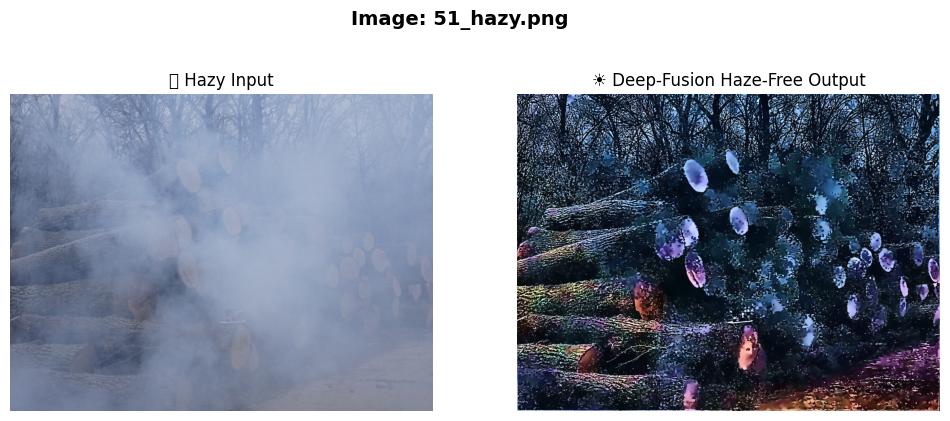

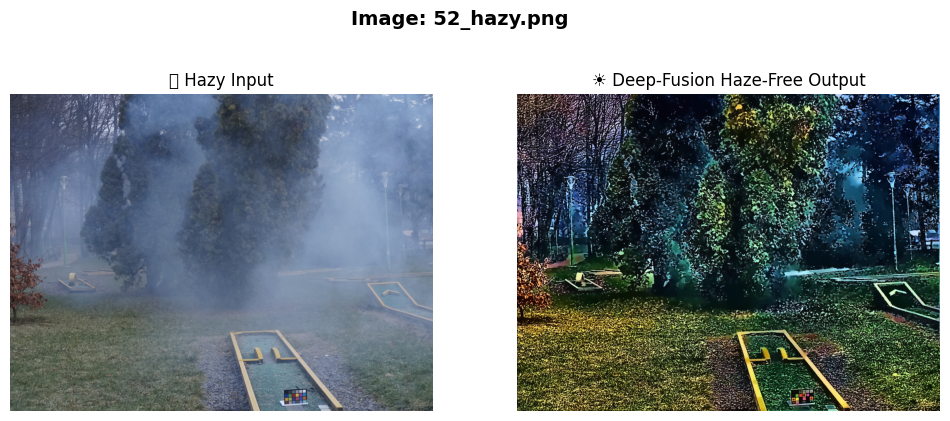

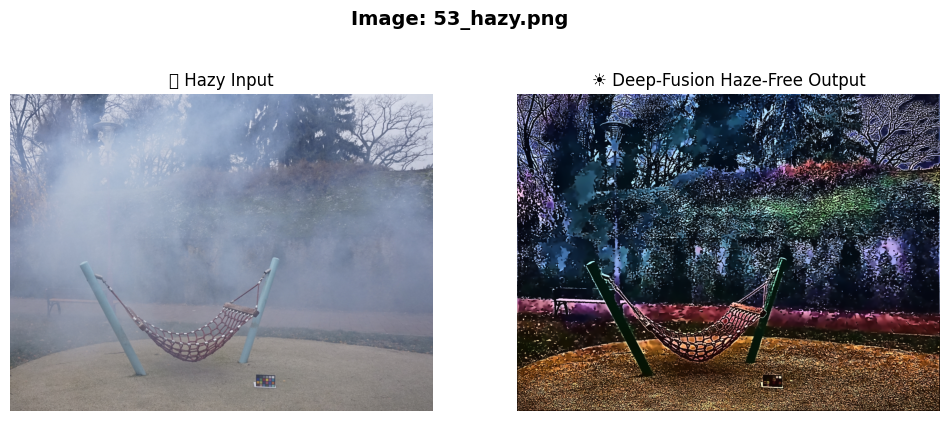

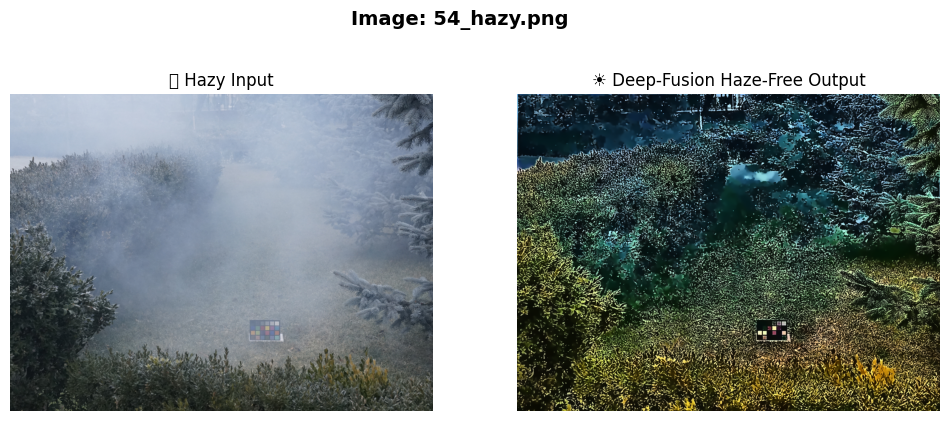

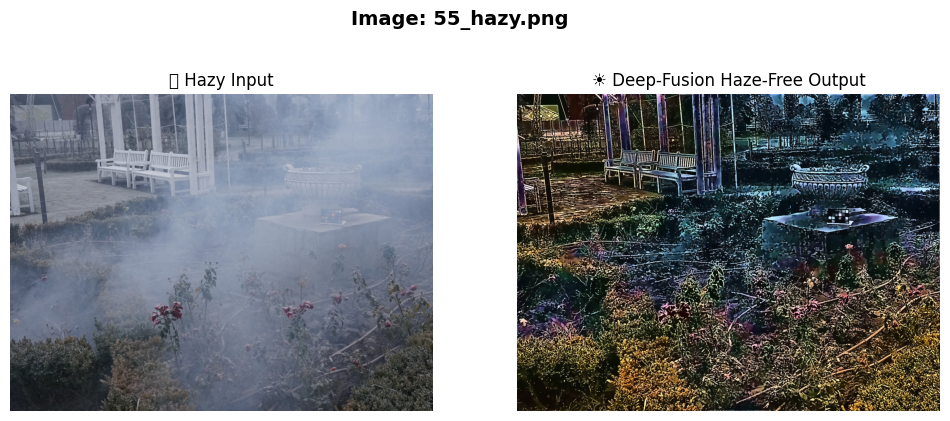

In [38]:
import matplotlib.pyplot as plt
from PIL import Image
import os

INPUT_DIR = '/content/drive/MyDrive/Nhazing/NHHaze/test/input'
OUTPUT_DIR = '/content/drive/MyDrive/Ultra_Dehaze_Final_Fused'

for name in sorted(os.listdir(INPUT_DIR)):
    if not name.lower().endswith(('.png', '.jpg', '.jpeg')):
        continue

    inp_path = os.path.join(INPUT_DIR, name)
    out_path = os.path.join(OUTPUT_DIR, name)

    if not os.path.exists(out_path):
        print(f"⚠️ Output not found for {name}")
        continue

    inp_img = Image.open(inp_path).convert('RGB')
    out_img = Image.open(out_path).convert('RGB')

    plt.figure(figsize=(12, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(inp_img)
    plt.title("🌫️ Hazy Input")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(out_img)
    plt.title("☀️ Deep-Fusion Haze-Free Output")
    plt.axis('off')

    plt.suptitle(f"Image: {name}", fontsize=14, fontweight='bold')
    plt.show()


In [41]:
import pandas as pd

# Make sure lengths are equal before creating the DataFrame
valid_entries = min(len(psnr_list), len(ssim_list))
file_names = file_names[:valid_entries]  # trim file_names if needed

results = pd.DataFrame({
    'Image': file_names,
    'PSNR': psnr_list[:valid_entries],
    'SSIM': ssim_list[:valid_entries]
})

csv_path = os.path.join(OUTPUT_PATH, 'PSNR_SSIM_Results.csv')
results.to_csv(csv_path, index=False)

print(f"\n📁 Results saved to: {csv_path}")
print(f"✅ Saved {len(results)} records successfully!")



📁 Results saved to: /content/drive/MyDrive/Ultra_Dehaze_Final_Fused/PSNR_SSIM_Results.csv
✅ Saved 0 records successfully!


In [44]:
import os

TEST_PATH = '/content/drive/MyDrive/Nhazing/NHHaze/test'

print("📁 Checking folder structure under:", TEST_PATH)
for root, dirs, files in os.walk(TEST_PATH):
    print(f"\nFolder: {root}")
    for d in dirs:
        print(f"  🗂️ Subfolder: {d}")
    for f in files[:5]:  # show first 5 files for preview
        print(f"  🖼️ File: {f}")


📁 Checking folder structure under: /content/drive/MyDrive/Nhazing/NHHaze/test

Folder: /content/drive/MyDrive/Nhazing/NHHaze/test
  🗂️ Subfolder: target
  🗂️ Subfolder: input

Folder: /content/drive/MyDrive/Nhazing/NHHaze/test/target
  🖼️ File: 52_GT.png
  🖼️ File: 53_GT.png
  🖼️ File: 51_GT.png
  🖼️ File: 54_GT.png
  🖼️ File: 55_GT.png

Folder: /content/drive/MyDrive/Nhazing/NHHaze/test/input
  🖼️ File: 52_hazy.png
  🖼️ File: 55_hazy.png
  🖼️ File: 53_hazy.png
  🖼️ File: 54_hazy.png
  🖼️ File: 51_hazy.png


In [45]:
import os
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio as psnr
from skimage.metrics import structural_similarity as ssim

# === PATHS ===
GT_PATH = '/content/drive/MyDrive/Nhazing/NHHaze/test/target'  # Ground-truth folder
OUTPUT_PATH = '/content/drive/MyDrive/Ultra_Dehaze_Final_Fused'  # Your final output folder

# === CALCULATE METRICS ===
psnr_list, ssim_list, file_names = [], [], []

# List all output files
file_names = sorted([f for f in os.listdir(OUTPUT_PATH) if f.endswith(('.png', '.jpg'))])

for name in file_names:
    gt_name = name.replace('_hazy', '_GT')  # Match naming convention
    gt_file = os.path.join(GT_PATH, gt_name)
    pred_file = os.path.join(OUTPUT_PATH, name)

    if not os.path.exists(gt_file):
        print(f"⚠️ Missing GT for {name}")
        continue

    # Read ground truth and predicted images
    gt = cv2.imread(gt_file)
    pred = cv2.imread(pred_file)

    # Resize GT if shape mismatch
    if gt.shape != pred.shape:
        gt = cv2.resize(gt, (pred.shape[1], pred.shape[0]))

    # Convert to RGB
    gt = cv2.cvtColor(gt, cv2.COLOR_BGR2RGB)
    pred = cv2.cvtColor(pred, cv2.COLOR_BGR2RGB)

    # Compute PSNR & SSIM
    psnr_val = psnr(gt, pred, data_range=255)
    ssim_val = ssim(gt, pred, channel_axis=2, data_range=255)

    psnr_list.append(psnr_val)
    ssim_list.append(ssim_val)

    print(f"✅ {name} → PSNR: {psnr_val:.3f} dB | SSIM: {ssim_val:.4f}")

# === AVERAGE RESULTS ===
if psnr_list and ssim_list:
    avg_psnr = np.mean(psnr_list)
    avg_ssim = np.mean(ssim_list)
    print("\n📊 === FINAL AVERAGE METRICS ===")
    print(f"Average PSNR: {avg_psnr:.3f} dB")
    print(f"Average SSIM: {avg_ssim:.4f}")
else:
    print("\n⚠️ No valid image pairs found — check output folder or naming pattern.")

# === SAVE RESULTS TO CSV ===
import pandas as pd

results = pd.DataFrame({
    'Image': file_names[:len(psnr_list)],
    'PSNR': psnr_list,
    'SSIM': ssim_list
})

csv_path = os.path.join(OUTPUT_PATH, 'PSNR_SSIM_Results.csv')
results.to_csv(csv_path, index=False)

print(f"\n💾 Results saved to: {csv_path}")


✅ 51_hazy.png → PSNR: 12.231 dB | SSIM: 0.3240
✅ 52_hazy.png → PSNR: 12.663 dB | SSIM: 0.3611
✅ 53_hazy.png → PSNR: 10.584 dB | SSIM: 0.3084
✅ 54_hazy.png → PSNR: 10.311 dB | SSIM: 0.3892
✅ 55_hazy.png → PSNR: 10.698 dB | SSIM: 0.4036

📊 === FINAL AVERAGE METRICS ===
Average PSNR: 11.297 dB
Average SSIM: 0.3573

💾 Results saved to: /content/drive/MyDrive/Ultra_Dehaze_Final_Fused/PSNR_SSIM_Results.csv
